# Mission

Data Scientist chez Academy, l'objectif est d'établir une analyse exploratoire en vue d'une expansion à l'internationale.

Il faut donc répondre aux questions: 
- Quels sont les pays avec un fort potentiel de clients pour nos services ?
- Pour chacun de ces pays, quelle sera l’évolution de ce potentiel de clients ?
- Dans quels pays l'entreprise doit-elle opérer en priorité ?

Les étapes pour y parvenir sont les suivantes :
- Valider la qualité de ce jeu de données (comporte-t-il beaucoup de données manquantes, dupliquées ?)
- Décrire les informations contenues dans le jeu de données (nombre de colonnes ? nombre de lignes ?)
- Sélectionner les informations qui semblent pertinentes pour répondre à la problématique (quelles sont les colonnes contenant des informations qui peuvent être utiles pour répondre à la problématique de l’entreprise ?)
- Déterminer des ordres de grandeurs des indicateurs statistiques classiques pour les différentes zones géographiques et pays du monde (moyenne/médiane/écart-type par pays et par continent ou bloc géographique)

# Stratégie de résolution du problème

- Analyse des différents jeux de données (à quoi correspondent-t-ils / Nombre de données / qualité des données)
- Choix des indicateurs à sélectionner pour notre pré-analyse :
    - Population lycée - université : 15-24 ans (population totale, nombre d'étudiants en secondaire et tertiaire)
    - Niveau de vie du pays (richesse nationale, investissement dans l'éducation)
    - Infrastructure réseau (qualité du service, usage d'un ordinateur)
- Etude de ses indicateurs par des méthodes statistiques classique
- Etablissement d'un score par pays, sur la base des indicateurs sélectionnés

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import scipy.stats as st

In [2]:
data = pd.read_csv('Projet Python Dataset Edstats/EdStatsData.csv', sep=',')

country = pd.read_csv('Projet Python Dataset Edstats/EdStatsCountry.csv', sep=',')

countrySeries = pd.read_csv('Projet Python Dataset Edstats/EdStatsCountry-Series.csv', sep=',')

footNote = pd.read_csv('Projet Python Dataset Edstats/EdStatsFootNote.csv', sep=',')

series = pd.read_csv('Projet Python Dataset Edstats/EdStatsSeries.csv', sep=',')

# Analyse des jeux de données
## Country

In [3]:
country.head()

,Country Code,Short Name,Table Name,Long Name,2-alpha code,Currency Unit,Special Notes,Region,Income Group,WB-2 code,...,IMF data dissemination standard,Latest population census,Latest household survey,Source of most recent Income and expenditure data,Vital registration complete,Latest agricultural census,Latest industrial data,Latest trade data,Latest water withdrawal data,Unnamed: 31
0,ABW,Aruba,Aruba,Aruba,AW,Aruban florin,SNA data for 2000-2011 are updated from offici...,Latin America & Caribbean,High income: nonOECD,AW,...,NaN,2010,NaN,NaN,Yes,NaN,NaN,2012.0,NaN,NaN
1,AFG,Afghanistan,Afghanistan,Islamic State of Afghanistan,AF,Afghan afghani,Fiscal year end: March 20; reporting period fo...,South Asia,Low income,AF,...,General Data Dissemination System (GDDS),1979,"Multiple Indicator Cluster Survey (MICS), 2010/11","Integrated household survey (IHS), 2008",NaN,2013/14,NaN,2012.0,2000,NaN
2,AGO,Angola,Angola,People's Republic of Angola,AO,Angolan kwanza,"April 2013 database update: Based on IMF data,...",Sub-Saharan Africa,Upper middle income,AO,...,General Data Dissemination System (GDDS),1970,"Malaria Indicator Survey (MIS), 2011","Integrated household survey (IHS), 2008",NaN,2015,NaN,NaN,2005,NaN
3,ALB,Albania,Albania,Republic of Albania,AL,Albanian lek,NaN,Europe & Central Asia,Upper middle income,AL,...,General Data Dissemination System (GDDS),2011,"Demographic and Health Survey (DHS), 2008/09",Living Standards Measurement Study Survey (LSM...,Yes,2012,2010.0,2012.0,2006,NaN
4,AND,Andorra,Andorra,Principality of Andorra,AD,Euro,NaN,Europe & Central Asia,High income: nonOECD,AD,...,NaN,2011. Population figures compiled from adminis...,NaN,NaN,Yes,NaN,NaN,2006.0,NaN,NaN


In [4]:
country.shape

(241, 32)

In [5]:
country.columns

Index(['Country Code', 'Short Name', 'Table Name', 'Long Name', '2-alpha code',
       'Currency Unit', 'Special Notes', 'Region', 'Income Group', 'WB-2 code',
       'National accounts base year', 'National accounts reference year',
       'SNA price valuation', 'Lending category', 'Other groups',
       'System of National Accounts', 'Alternative conversion factor',
       'PPP survey year', 'Balance of Payments Manual in use',
       'External debt Reporting status', 'System of trade',
       'Government Accounting concept', 'IMF data dissemination standard',
       'Latest population census', 'Latest household survey',
       'Source of most recent Income and expenditure data',
       'Vital registration complete', 'Latest agricultural census',
       'Latest industrial data', 'Latest trade data',
       'Latest water withdrawal data', 'Unnamed: 31'],
      dtype='object')

In [6]:
country.dtypes

Country Code                                          object
Short Name                                            object
Table Name                                            object
Long Name                                             object
2-alpha code                                          object
Currency Unit                                         object
Special Notes                                         object
Region                                                object
Income Group                                          object
WB-2 code                                             object
National accounts base year                           object
National accounts reference year                     float64
SNA price valuation                                   object
Lending category                                      object
Other groups                                          object
System of National Accounts                           object
Alternative conversion f

In [7]:
country.describe

<bound method NDFrame.describe of     Country Code    Short Name    Table Name                     Long Name  \
0            ABW         Aruba         Aruba                         Aruba   
1            AFG   Afghanistan   Afghanistan  Islamic State of Afghanistan   
2            AGO        Angola        Angola   People's Republic of Angola   
3            ALB       Albania       Albania           Republic of Albania   
4            AND       Andorra       Andorra       Principality of Andorra   
..           ...           ...           ...                           ...   
236          XKX        Kosovo        Kosovo            Republic of Kosovo   
237          YEM         Yemen   Yemen, Rep.             Republic of Yemen   
238          ZAF  South Africa  South Africa      Republic of South Africa   
239          ZMB        Zambia        Zambia            Republic of Zambia   
240          ZWE      Zimbabwe      Zimbabwe          Republic of Zimbabwe   

    2-alpha code       Curren

In [8]:
country.loc[country['Country Code'].duplicated(keep=False),:]

,Country Code,Short Name,Table Name,Long Name,2-alpha code,Currency Unit,Special Notes,Region,Income Group,WB-2 code,...,IMF data dissemination standard,Latest population census,Latest household survey,Source of most recent Income and expenditure data,Vital registration complete,Latest agricultural census,Latest industrial data,Latest trade data,Latest water withdrawal data,Unnamed: 31


In [9]:
country.isna().sum()

Country Code                                           0
Short Name                                             0
Table Name                                             0
Long Name                                              0
2-alpha code                                           3
Currency Unit                                         26
Special Notes                                         96
Region                                                27
Income Group                                          27
WB-2 code                                              1
National accounts base year                           36
National accounts reference year                     209
SNA price valuation                                   44
Lending category                                      97
Other groups                                         183
System of National Accounts                           26
Alternative conversion factor                        194
PPP survey year                

In [10]:
country.isna().sum().sum()

2354

In [11]:
nb_pays_region= country.groupby('Region')['Country Code'].size().reset_index().sort_values(by='Country Code', ascending=False)

C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


[Text(0.5, 0, 'Nombre de pays'), Text(0, 0.5, 'Régions')]

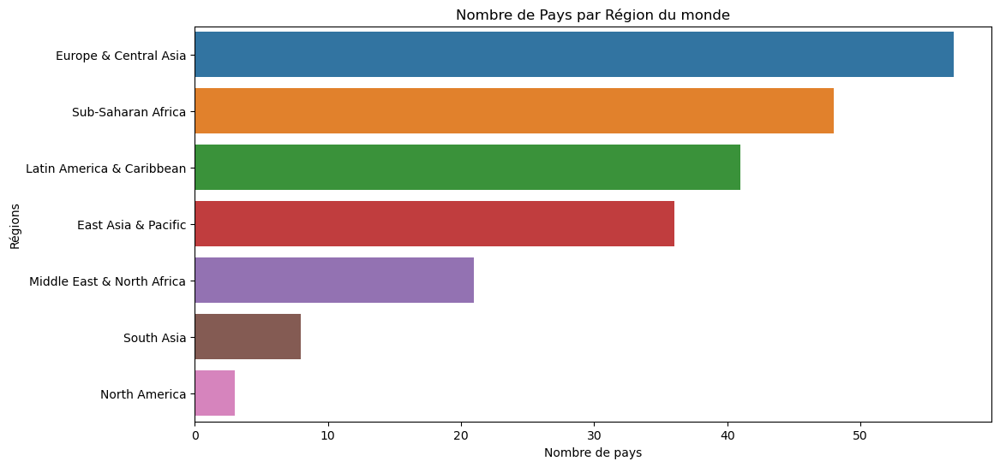

In [12]:
plt.figure(figsize=(12,6))
plt.title('Nombre de Pays par Région du monde')

sns.barplot(data=nb_pays_region, x='Country Code', y='Region', errorbar=None).set(xlabel='Nombre de pays', ylabel='Régions')

In [13]:
country['Income Order'] = ''
country.loc[country['Income Group'] == 'High income: OECD', 'Income Order'] = '0. High income: OECD'
country.loc[country['Income Group'] == 'High income: nonOECD', 'Income Order'] = '1. High income: nonOECD'
country.loc[country['Income Group'] == 'Low income', 'Income Order'] = '4. Low income'
country.loc[country['Income Group'] == 'Lower middle income', 'Income Order'] = '3. Lower middle income'
country.loc[country['Income Group'] == 'Upper middle income', 'Income Order'] = '2. Upper middle income'
country.loc[country['Income Group'].isna(), 'Income Order'] = 'NA'

In [14]:
income_country = country.groupby('Income Order')['Country Code'].size().reset_index()

income_country.sort_values(by='Income Order', inplace=True)

C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


[Text(0.5, 0, 'Catégorie de richesse'), Text(0, 0.5, 'Nombre de pays')]

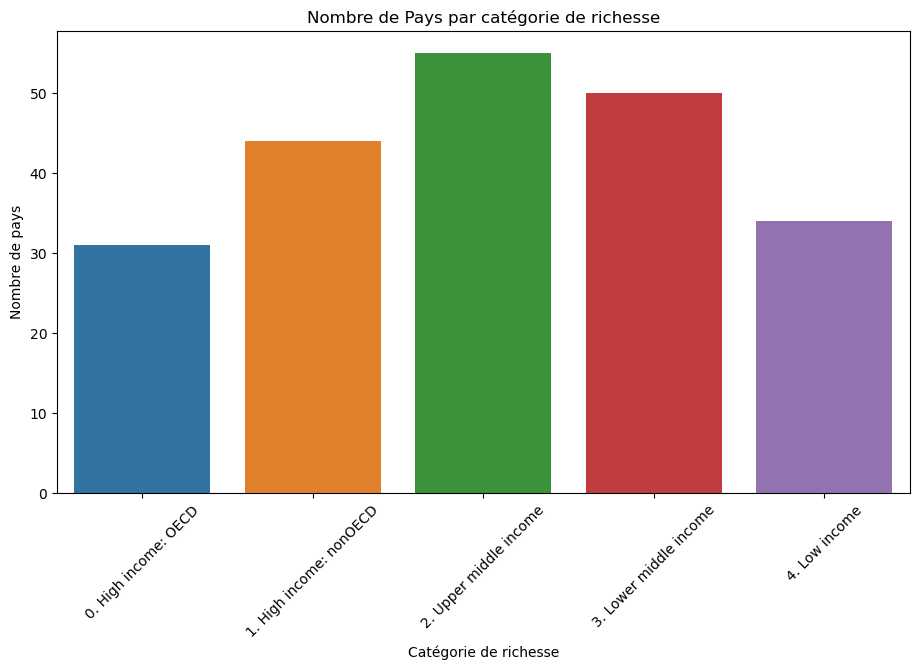

In [15]:
plt.figure(figsize=(11,6))
plt.title('Nombre de Pays par catégorie de richesse')
plt.xticks(rotation=45)
sns.barplot(data=income_country.iloc[:-1,:], x='Income Order', y='Country Code').set(xlabel='Catégorie de richesse', ylabel='Nombre de pays')

In [16]:
income_region = country[['Region', 'Income Order']].pivot_table(index=['Income Order'], columns=['Region'], aggfunc=len).sort_values(by='Income Order')

income_region = income_region.fillna(0)
income_region.rename(columns={"Country Code": 'Country count'}, inplace=True)

income_region

Region,East Asia & Pacific,Europe & Central Asia,Latin America & Caribbean,Middle East & North Africa,North America,South Asia,Sub-Saharan Africa
Income Order,,,,,,,
0. High income: OECD,4.0,23.0,1.0,1.0,2.0,0.0,0.0
1. High income: nonOECD,8.0,13.0,14.0,7.0,1.0,0.0,1.0
2. Upper middle income,9.0,13.0,18.0,7.0,0.0,1.0,7.0
3. Lower middle income,12.0,7.0,7.0,6.0,0.0,4.0,14.0
4. Low income,3.0,1.0,1.0,0.0,0.0,3.0,26.0


[Text(0.5, 23.52222222222222, 'Région'),
 Text(50.7222222222222, 0.5, 'Catégorie de richesse')]

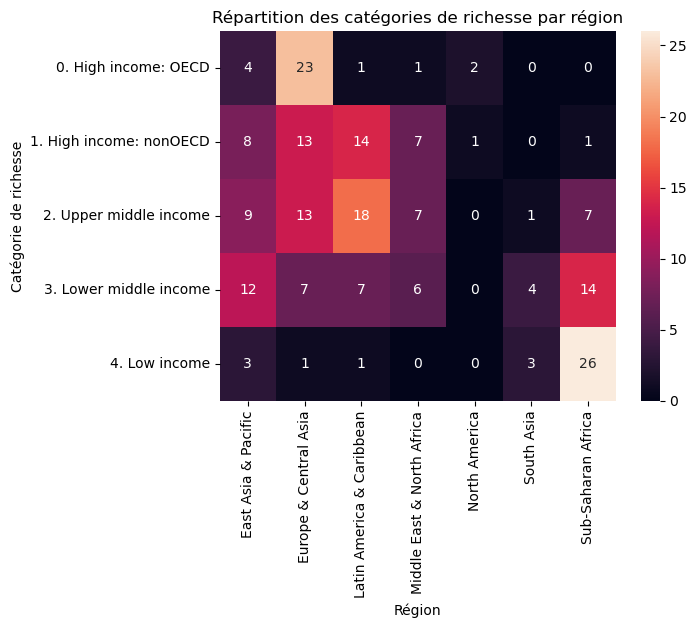

In [17]:
plt.title("Répartition des catégories de richesse par région")
sns.heatmap(income_region, annot=True).set(xlabel='Région', ylabel='Catégorie de richesse')

### Conclusions sur country

241 pays pour 31 indicateurs (+ une colonne à supprimer)  
2 354 valeurs manquantes sur 7 712 (dont la colonne à supprimer "Unnamed: 31")  
Aucun doublons sur les pays

Les informations pertinentes dans ce jeu de données pour répondre à notre problématique sont la répartition des pays par région géographique, ainsi que la répartition des richesses dans ces régions.   
Les autres indicateurs permettent principalement d'avoir une idée de l'actualisation des données de la banque mondiale.  
On constate qu'il y a une quantité importante de pays en Europe & Asie Central, ainsi qu'en Afrique (total). Cependant, il faudra regarder le nombre d'habitant par pays pour avoir une idée plus précise des pays cibles.

Il y a une majorite de pays à hauts revenus (OECD + non OECD), il faudra probablement concentrer la pré analyse sur ces pays là.  
Les pays à hauts revenus sont principalement concentrés en Europe, Asie et Amérique.

## Country Series

In [18]:
countrySeries.head()

,CountryCode,SeriesCode,DESCRIPTION,Unnamed: 3
0,ABW,SP.POP.TOTL,Data sources : United Nations World Population...,NaN
1,ABW,SP.POP.GROW,Data sources: United Nations World Population ...,NaN
2,AFG,SP.POP.GROW,Data sources: United Nations World Population ...,NaN
3,AFG,NY.GDP.PCAP.PP.CD,Estimates are based on regression.,NaN
4,AFG,SP.POP.TOTL,Data sources : United Nations World Population...,NaN


In [19]:
countrySeries.shape

(613, 4)

In [20]:
countrySeries.columns

Index(['CountryCode', 'SeriesCode', 'DESCRIPTION', 'Unnamed: 3'], dtype='object')

In [21]:
countrySeries.dtypes

CountryCode     object
SeriesCode      object
DESCRIPTION     object
Unnamed: 3     float64
dtype: object

In [22]:
countrySeries.loc[countrySeries[['CountryCode', 'SeriesCode']].duplicated(keep=False),:]

,CountryCode,SeriesCode,DESCRIPTION,Unnamed: 3


In [23]:
countrySeries.isna().sum()

CountryCode      0
SeriesCode       0
DESCRIPTION      0
Unnamed: 3     613
dtype: int64

In [24]:
countrySeries['SeriesCode'].unique()

array(['SP.POP.TOTL', 'SP.POP.GROW', 'NY.GDP.PCAP.PP.CD',
       'NY.GDP.MKTP.PP.KD', 'NY.GNP.MKTP.PP.CD', 'NY.GDP.MKTP.PP.CD',
       'NY.GDP.PCAP.PP.KD', 'NY.GNP.PCAP.PP.CD', 'SP.POP.1564.TO.ZS',
       'SP.POP.TOTL.MA.ZS', 'SP.POP.TOTL.FE.ZS', 'SP.POP.0014.TO.ZS',
       'NY.GNP.PCAP.CD', 'NY.GDP.PCAP.CD', 'NY.GDP.PCAP.KD',
       'SP.POP.1564.MA.IN', 'SP.POP.0014.TO', 'SP.POP.1564.TO',
       'SP.POP.1564.FE.IN', 'SP.POP.0014.MA.IN', 'SP.POP.0014.FE.IN'],
      dtype=object)

In [25]:
countrySeries['DESCRIPTION'].unique()

array(['Data sources : United Nations World Population Prospects',
       'Data sources: United Nations World Population Prospects',
       'Estimates are based on regression.',
       'Data sources : Institute of Statistics, Eurostat',
       'Data sources : Australian Bureau of Statistics',
       'Including Other Territories comprising Jervis Bay Territory, Christmas Island and the Cocos (Keeling) Islands. ',
       'Data sources: Australian Bureau of Statistics',
       'Data sources : Eurostat',
       'Data sources : Eurostat, State Statistical Committee, United Nations World Population Prospects',
       'Data sources: Eurostat, State Statistical Committee, United Nations World Population Prospects',
       'Data sources : National Statistical Committee of the Republic of Belarus',
       'Data sources: National Statistical Committee of the Republic of Belarus',
       'Data sources : Bermuda Government Department of Statistics',
       'Data sources: Bermuda Government Departme

In [26]:
countrySeries['SeriesCode'].unique().shape

(21,)

In [27]:
countrySeries['CountryCode'].unique().shape

(211,)

#### Nombre de pays par indicateurs

In [28]:
#Calcul du mode
countrySeries['SeriesCode'].mode()

0    SP.POP.GROW
1    SP.POP.TOTL
Name: SeriesCode, dtype: object

In [29]:
# Distribution empirique de SeriesCode
countrySeries_indic = countrySeries.groupby(['SeriesCode'])['CountryCode'].size().reset_index().sort_values(by='CountryCode', ascending=False)
countrySeries_indic['frequence'] = countrySeries_indic['CountryCode'] / countrySeries_indic['CountryCode'].sum()

countrySeries_indic

,SeriesCode,CountryCode,frequence
18,SP.POP.TOTL,211,0.344209
17,SP.POP.GROW,211,0.344209
4,NY.GDP.PCAP.PP.CD,19,0.030995
5,NY.GDP.PCAP.PP.KD,19,0.030995
8,NY.GNP.PCAP.PP.CD,19,0.030995
0,NY.GDP.MKTP.PP.CD,14,0.022838
6,NY.GNP.MKTP.PP.CD,14,0.022838
1,NY.GDP.MKTP.PP.KD,14,0.022838
12,SP.POP.0014.TO.ZS,13,0.021207
19,SP.POP.TOTL.FE.ZS,13,0.021207


C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


[Text(0.5, 0, 'Nombre de pays'), Text(0, 0.5, 'Indicateurs')]

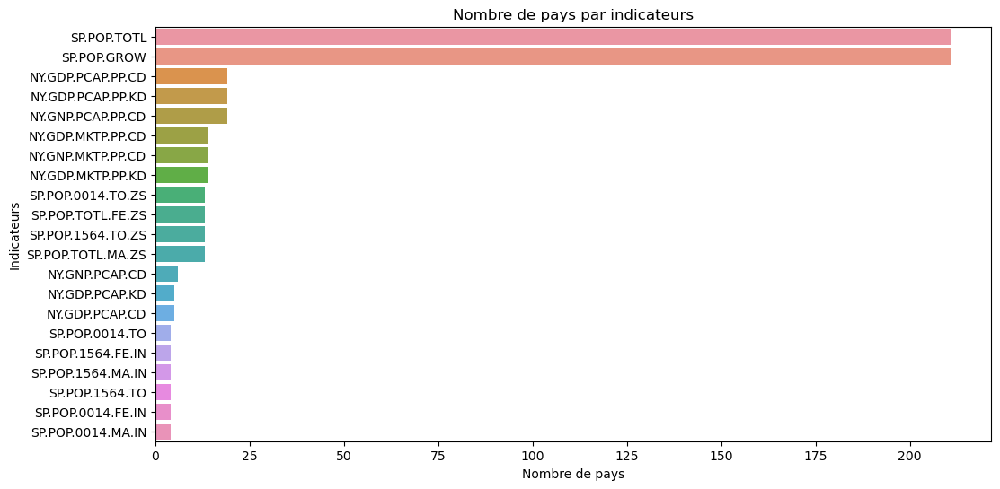

In [30]:
plt.figure(figsize=(12,6))
plt.title('Nombre de pays par indicateurs')

sns.barplot(data=countrySeries_indic, x='CountryCode', y='SeriesCode', errorbar=None).set(xlabel='Nombre de pays', ylabel='Indicateurs')

### Conclusion sur CountrySeries

211 pays pour 4 variables  
21 Code séries  
Aucune valeur manquante (sauf une colonne, à supprimer)  
Aucun doublons sur code pays et code série

Les informations pertinentes dans ce jeu de données pour répondre à notre problématique sont les codes de séries, ainsi que le nombre de pays répondant à ces indicateurs.  
Les indicateurs dont la totalité des pays du jeu de données ont répondu sont SP.POP.GROW et SP.POP.TOTL, qui correspondent respectivement aux projections de population, ainsi qu'à la population actuelle des pays. ces valeurs seront être pertinentes pour notre pré-analyse.

## FootNotes

In [31]:
footNote.head()

,CountryCode,SeriesCode,Year,DESCRIPTION,Unnamed: 4
0,ABW,SE.PRE.ENRL.FE,YR2001,Country estimation.,NaN
1,ABW,SE.TER.TCHR.FE,YR2005,Country estimation.,NaN
2,ABW,SE.PRE.TCHR.FE,YR2000,Country estimation.,NaN
3,ABW,SE.SEC.ENRL.GC,YR2004,Country estimation.,NaN
4,ABW,SE.PRE.TCHR,YR2006,Country estimation.,NaN


In [32]:
footNote.shape

(643638, 5)

In [33]:
footNote.columns

Index(['CountryCode', 'SeriesCode', 'Year', 'DESCRIPTION', 'Unnamed: 4'], dtype='object')

In [34]:
footNote.dtypes

CountryCode     object
SeriesCode      object
Year            object
DESCRIPTION     object
Unnamed: 4     float64
dtype: object

In [35]:
footNote.describe

<bound method NDFrame.describe of        CountryCode      SeriesCode    Year  \
0              ABW  SE.PRE.ENRL.FE  YR2001   
1              ABW  SE.TER.TCHR.FE  YR2005   
2              ABW  SE.PRE.TCHR.FE  YR2000   
3              ABW  SE.SEC.ENRL.GC  YR2004   
4              ABW     SE.PRE.TCHR  YR2006   
...            ...             ...     ...   
643633         ZWE     SH.DYN.MORT  YR2007   
643634         ZWE     SH.DYN.MORT  YR2014   
643635         ZWE     SH.DYN.MORT  YR2015   
643636         ZWE     SH.DYN.MORT  YR2017   
643637         ZWE     SP.POP.GROW  YR2017   

                                   DESCRIPTION  Unnamed: 4  
0                          Country estimation.         NaN  
1                          Country estimation.         NaN  
2                          Country estimation.         NaN  
3                          Country estimation.         NaN  
4                          Country estimation.         NaN  
...                                        ... 

In [36]:
footNote.isna().sum()

CountryCode         0
SeriesCode          0
Year                0
DESCRIPTION         0
Unnamed: 4     643638
dtype: int64

In [37]:
footNote.loc[footNote[['CountryCode', 'SeriesCode', 'Year']].duplicated(keep=False),:]

,CountryCode,SeriesCode,Year,DESCRIPTION,Unnamed: 4


In [38]:
footNote['CountryCode'].unique().size

239

In [39]:
footNote['SeriesCode'].unique().size

1558

In [40]:
footNote['Year'].unique().size

56

#### Nombre de valeurs par indicateurs

In [41]:
#Calcul du mode
footNote['SeriesCode'].mode()

0    SH.DYN.MORT
Name: SeriesCode, dtype: object

In [42]:
# Distribution empirique de SeriesCode
foot_indic = footNote.groupby(['SeriesCode'])['CountryCode'].size().reset_index().sort_values(by='CountryCode', ascending=False)
foot_indic['frequence'] = foot_indic['CountryCode'] / len(footNote)

# On affiche les 10 indicateurs les plus renseignés
foot_indic.head(10)

,SeriesCode,CountryCode,frequence
650,SH.DYN.MORT,9226,0.014334
504,SE.PRM.AGES,8771,0.013627
514,SE.PRM.DURS,8771,0.013627
560,SE.SEC.DURS,8619,0.013391
556,SE.SEC.AGES,8581,0.013332
515,SE.PRM.ENRL,6610,0.010270
519,SE.PRM.ENRR,6418,0.009971
517,SE.PRM.ENRL.FE.ZS,6177,0.009597
516,SE.PRM.ENRL.FE,6165,0.009578
486,SE.ENR.PRIM.FM.ZS,6013,0.009342


C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


[Text(0.5, 0, 'Nombre de valeurs'), Text(0, 0.5, 'Indicateurs')]

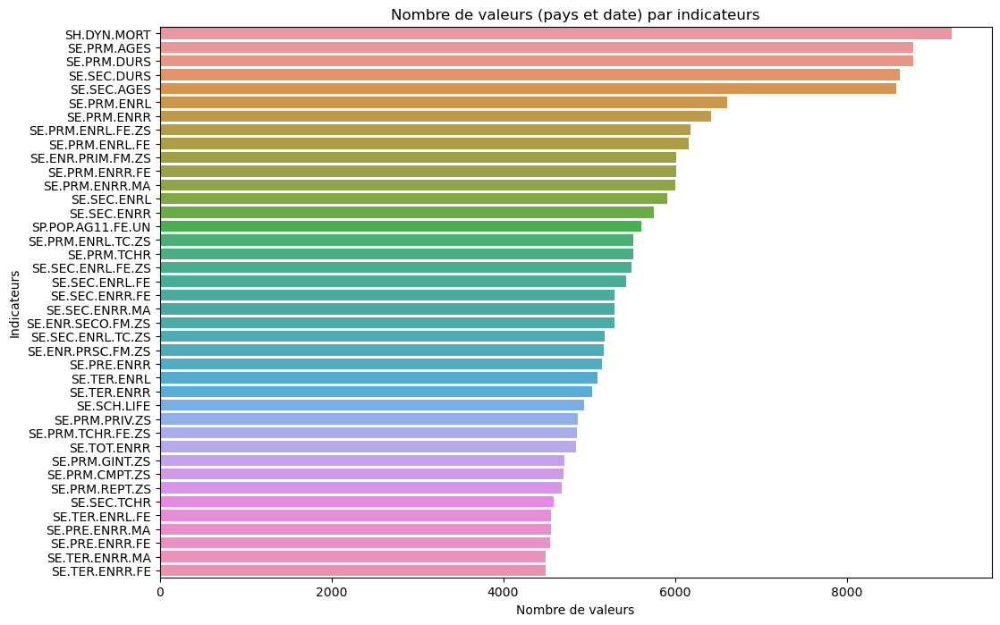

In [43]:
plt.figure(figsize=(12,8))
plt.title('Nombre de valeurs (pays et date) par indicateurs')

sns.barplot(data=foot_indic.head(40), x='CountryCode', y='SeriesCode', errorbar=None).set(xlabel='Nombre de valeurs', ylabel='Indicateurs')

In [44]:
footNote['Year'].unique()

array(['YR2001', 'YR2005', 'YR2000', 'YR2004', 'YR2006', 'YR2003',
       'YR1999', 'YR2008', 'YR2002', 'YR2007', 'YR2017', 'YR2010',
       'YR2009', 'YR2011', 'YR2012', 'YR2015', 'YR2014', 'YR1970',
       'YR1971', 'YR1972', 'YR1973', 'YR1974', 'YR1975', 'YR1976',
       'YR1977', 'YR1978', 'YR1979', 'YR1980', 'YR1981', 'YR1982',
       'YR1983', 'YR1984', 'YR1985', 'YR1986', 'YR1987', 'YR1988',
       'YR1989', 'YR1990', 'YR1991', 'YR1992', 'YR1993', 'YR1994',
       'YR1995', 'YR1996', 'YR1997', 'YR1998', 'YR2013', 'YR2016',
       'YR2020', 'YR2025', 'YR2030', 'YR2035', 'YR2040', 'YR2045',
       'YR2050', 'yr2012'], dtype=object)

#### Nombre d'indicateurs par années

In [45]:
footNote['Year'] = footNote['Year'].str.replace('YR', '')
footNote['Year'] = footNote['Year'].str.replace('yr', '')#### Nombre d'indicateurs par pays#### Nombre d'indicateurs par pays

C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


[Text(0.5, 0, 'Années'), Text(0, 0.5, 'Nombre de valeurs')]

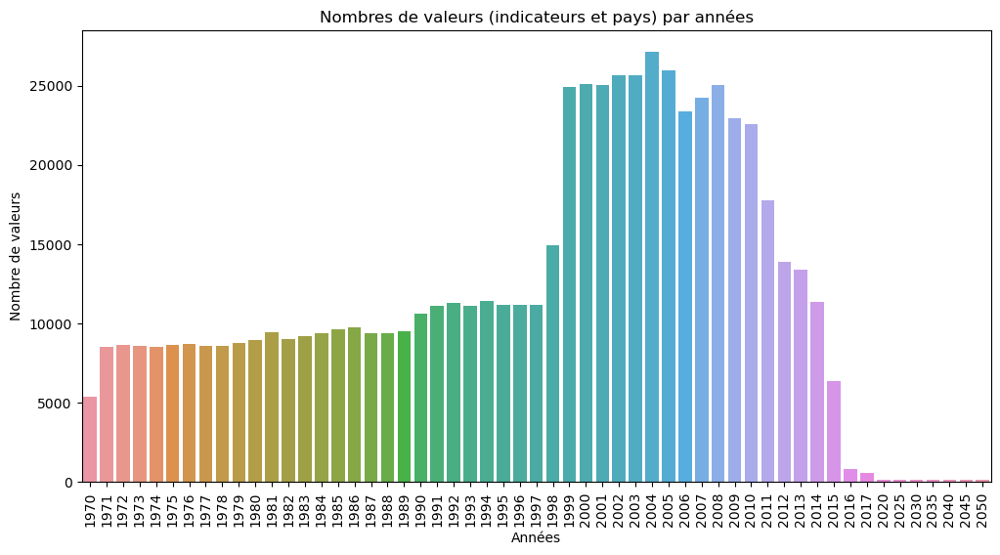

In [46]:
foot_year = footNote.groupby('Year')['SeriesCode'].count().reset_index()
plt.figure(figsize=(12,6))
plt.title("Nombres de valeurs (indicateurs et pays) par années")
plt.xticks(rotation=90)
sns.barplot(data=foot_year, x='Year', y='SeriesCode').set(xlabel='Années', ylabel='Nombre de valeurs')

#### Nombre d'indicateurs par pays

In [47]:
foot_countries = footNote[['CountryCode', 'SeriesCode']].groupby('CountryCode')['SeriesCode'].count().sort_values(ascending = False).reset_index()

foot_countries.head(10)

,CountryCode,SeriesCode
0,LIC,7320
1,CYP,7183
2,LDC,6481
3,SSA,6389
4,SSF,6336
5,HPC,6237
6,LAC,6116
7,MIC,5862
8,LMY,5839
9,LCN,5779


C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use 

[Text(0.5, 0, 'Code pays'), Text(0, 0.5, "Nombre d'indicateurs")]

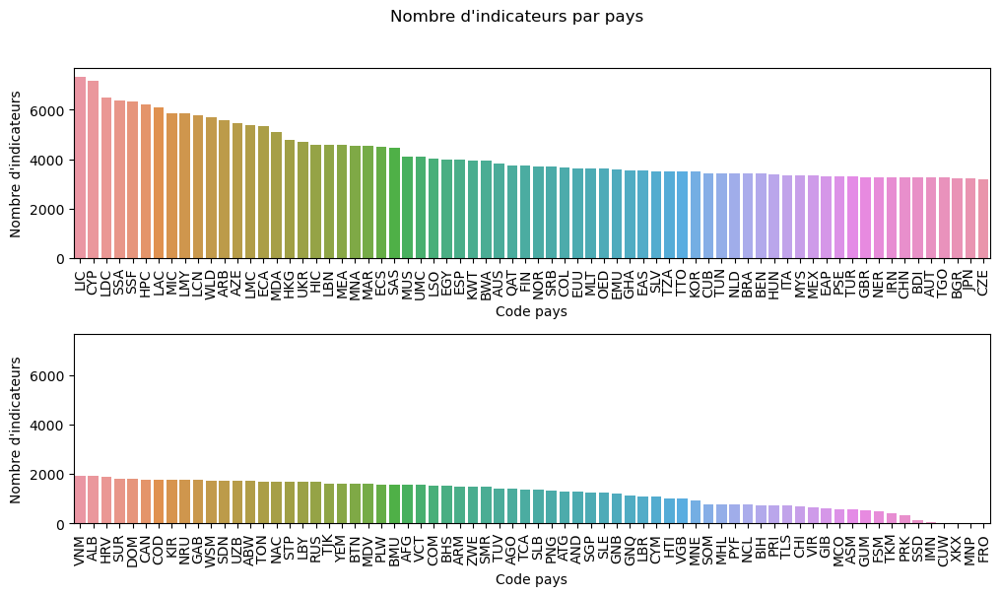

In [48]:
fig, (ax1, ax2) = plt.subplots(2,figsize=(12,6), sharey=True)
fig.suptitle("Nombre d'indicateurs par pays")
plt.subplots_adjust(hspace = 0.4)
ax1.tick_params(axis="x", labelrotation=90)
ax2.tick_params(axis="x", labelrotation=90)
sns.barplot(ax=ax1, data=foot_countries.head(70), x='CountryCode', y='SeriesCode').set(xlabel='Code pays', ylabel="Nombre d'indicateurs")
sns.barplot(ax=ax2, data=foot_countries.tail(70), x='CountryCode', y='SeriesCode').set(xlabel='Code pays', ylabel="Nombre d'indicateurs")

### Conclusion sur FootNote

239 code pays pour 1558 indicateurs sur 56 dates  
Aucune valeur manquante (sauf une colonne, à supprimer)  
Aucun doublons sur code pays et code série

Les informations pertinentes dans ce jeu de données pour répondre à notre problématique sont les codes de séries, les dates d'actualisation, ainsi que le nombre de pays répondant à ces indicateurs.

L'indicateur le plus renseigné est SH.DYN.MORT, qui correspond (d'après le site Education Statistics) à la mortalité infantile. Ensuite viennent des indicateurs sur les niveaux primaires et secondaires.  
Un très grand nombre d'indicateurs / pays sont renseignés entre 1999 et 2010, et un faible nombre sur les projection.  
Les pays ne sont pas renseignés de manière homogènes. Pour plus de clareté sur cette répartition, il faurait corréler à un autre jeu de données, comme Countries.

## Series

In [49]:
series.head()

,Series Code,Topic,Indicator Name,Short definition,Long definition,Unit of measure,Periodicity,Base Period,Other notes,Aggregation method,...,Notes from original source,General comments,Source,Statistical concept and methodology,Development relevance,Related source links,Other web links,Related indicators,License Type,Unnamed: 20
0,BAR.NOED.1519.FE.ZS,Attainment,Barro-Lee: Percentage of female population age...,Percentage of female population age 15-19 with...,Percentage of female population age 15-19 with...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,BAR.NOED.1519.ZS,Attainment,Barro-Lee: Percentage of population age 15-19 ...,Percentage of population age 15-19 with no edu...,Percentage of population age 15-19 with no edu...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,BAR.NOED.15UP.FE.ZS,Attainment,Barro-Lee: Percentage of female population age...,Percentage of female population age 15+ with n...,Percentage of female population age 15+ with n...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,BAR.NOED.15UP.ZS,Attainment,Barro-Lee: Percentage of population age 15+ wi...,Percentage of population age 15+ with no educa...,Percentage of population age 15+ with no educa...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,BAR.NOED.2024.FE.ZS,Attainment,Barro-Lee: Percentage of female population age...,Percentage of female population age 20-24 with...,Percentage of female population age 20-24 with...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Robert J. Barro and Jong-Wha Lee: http://www.b...,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [50]:
series.shape

(3665, 21)

In [51]:
series.columns

Index(['Series Code', 'Topic', 'Indicator Name', 'Short definition',
       'Long definition', 'Unit of measure', 'Periodicity', 'Base Period',
       'Other notes', 'Aggregation method', 'Limitations and exceptions',
       'Notes from original source', 'General comments', 'Source',
       'Statistical concept and methodology', 'Development relevance',
       'Related source links', 'Other web links', 'Related indicators',
       'License Type', 'Unnamed: 20'],
      dtype='object')

In [52]:
series.dtypes

Series Code                             object
Topic                                   object
Indicator Name                          object
Short definition                        object
Long definition                         object
Unit of measure                        float64
Periodicity                             object
Base Period                             object
Other notes                             object
Aggregation method                      object
Limitations and exceptions              object
Notes from original source             float64
General comments                        object
Source                                  object
Statistical concept and methodology     object
Development relevance                   object
Related source links                    object
Other web links                        float64
Related indicators                     float64
License Type                           float64
Unnamed: 20                            float64
dtype: object

In [53]:
series.describe

<bound method NDFrame.describe of                       Series Code         Topic  \
0             BAR.NOED.1519.FE.ZS    Attainment   
1                BAR.NOED.1519.ZS    Attainment   
2             BAR.NOED.15UP.FE.ZS    Attainment   
3                BAR.NOED.15UP.ZS    Attainment   
4             BAR.NOED.2024.FE.ZS    Attainment   
...                           ...           ...   
3660    UIS.XUNIT.USCONST.3.FSGOV  Expenditures   
3661    UIS.XUNIT.USCONST.4.FSGOV  Expenditures   
3662   UIS.XUNIT.USCONST.56.FSGOV  Expenditures   
3663  XGDP.23.FSGOV.FDINSTADM.FFD  Expenditures   
3664  XGDP.56.FSGOV.FDINSTADM.FFD  Expenditures   

                                         Indicator Name  \
0     Barro-Lee: Percentage of female population age...   
1     Barro-Lee: Percentage of population age 15-19 ...   
2     Barro-Lee: Percentage of female population age...   
3     Barro-Lee: Percentage of population age 15+ wi...   
4     Barro-Lee: Percentage of female population age...   

In [54]:
series.loc[series['Long definition'].duplicated(keep=False),:]

,Series Code,Topic,Indicator Name,Short definition,Long definition,Unit of measure,Periodicity,Base Period,Other notes,Aggregation method,...,Notes from original source,General comments,Source,Statistical concept and methodology,Development relevance,Related source links,Other web links,Related indicators,License Type,Unnamed: 20
360,HH.DHS.GAR.456,Education Equality,DHS: Gross attendance rate. Post Secondary,Gross attendance rate. Post Secondary is the n...,Gross attendance rate. Post Secondary is the n...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Demographic and Health Surveys (DHS),NaN,NaN,NaN,NaN,NaN,NaN,NaN
361,HH.DHS.GAR.456.F,Education Equality,DHS: Gross attendance rate. Post Secondary. Fe...,Gross attendance rate. Post Secondary. Female ...,Gross attendance rate. Post Secondary. Female ...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Demographic and Health Surveys (DHS),NaN,NaN,NaN,NaN,NaN,NaN,NaN
362,HH.DHS.GAR.456.M,Education Equality,DHS: Gross attendance rate. Post Secondary. Male,Gross attendance rate. Post Secondary. Male is...,Gross attendance rate. Post Secondary. Male is...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Demographic and Health Surveys (DHS),NaN,NaN,NaN,NaN,NaN,NaN,NaN
363,HH.DHS.GAR.456.Q1,Education Equality,DHS: Gross attendance rate. Post Secondary. Qu...,Gross attendance rate. Post Secondary. Quintil...,Gross attendance rate. Post Secondary. Quintil...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Demographic and Health Surveys (DHS),NaN,NaN,NaN,NaN,NaN,NaN,NaN
364,HH.DHS.GAR.456.Q2,Education Equality,DHS: Gross attendance rate. Post Secondary. Qu...,Gross attendance rate. Post Secondary. Quintil...,Gross attendance rate. Post Secondary. Quintil...,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,Demographic and Health Surveys (DHS),NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3660,UIS.XUNIT.USCONST.3.FSGOV,Expenditures,Government expenditure per upper secondary stu...,NaN,"Average total (current, capital and transfers)...",NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,UNESCO Institute for Statistics,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3661,UIS.XUNIT.USCONST.4.FSGOV,Expenditures,Government expenditure per post-secondary non-...,NaN,"Average total (current, capital and transfers)...",NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,UNESCO Institute for Statistics,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3662,UIS.XUNIT.USCONST.56.FSGOV,Expenditures,Government expenditure per tertiary student (c...,NaN,"Average total (current, capital and transfers)...",NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,UNESCO Institute for Statistics,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3663,XGDP.23.FSGOV.FDINSTADM.FFD,Expenditures,Government expenditure in secondary institutio...,"Total general (local, regional and central) go...","Total general (local, regional and central) go...",NaN,NaN,NaN,Secondary,NaN,...,NaN,NaN,UNESCO Institute for Statistics,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [55]:
series.isna().sum()

Series Code                               0
Topic                                     0
Indicator Name                            0
Short definition                       1509
Long definition                           0
Unit of measure                        3665
Periodicity                            3566
Base Period                            3351
Other notes                            3113
Aggregation method                     3618
Limitations and exceptions             3651
Notes from original source             3665
General comments                       3651
Source                                    0
Statistical concept and methodology    3642
Development relevance                  3662
Related source links                   3450
Other web links                        3665
Related indicators                     3665
License Type                           3665
Unnamed: 20                            3665
dtype: int64

In [56]:
series['Series Code'].unique().shape

(3665,)

In [57]:
effectifs = series["Topic"].value_counts()
modalites = effectifs.index # l'index de effectifs contient les Topic

tab = pd.DataFrame(modalites, columns = ["Topic"]) # création du tableau à partir des Topic
tab["eff"] = effectifs.values
tab["freq"] = tab["eff"] / len(series) # len(data) renvoie la taille de l'échantillon

tab

,Topic,eff,freq
0,Learning Outcomes,1046,0.285402
1,Attainment,733,0.200000
2,Education Equality,426,0.116235
3,Secondary,256,0.069850
4,Primary,248,0.067667
5,Population,213,0.058117
6,Tertiary,158,0.043111
7,Teachers,137,0.037381
8,Expenditures,93,0.025375
9,Engaging the Private Sector (SABER),51,0.013915


C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


[Text(0.5, 0, "Nombre d'indicateurs"), Text(0, 0.5, 'Sujets')]

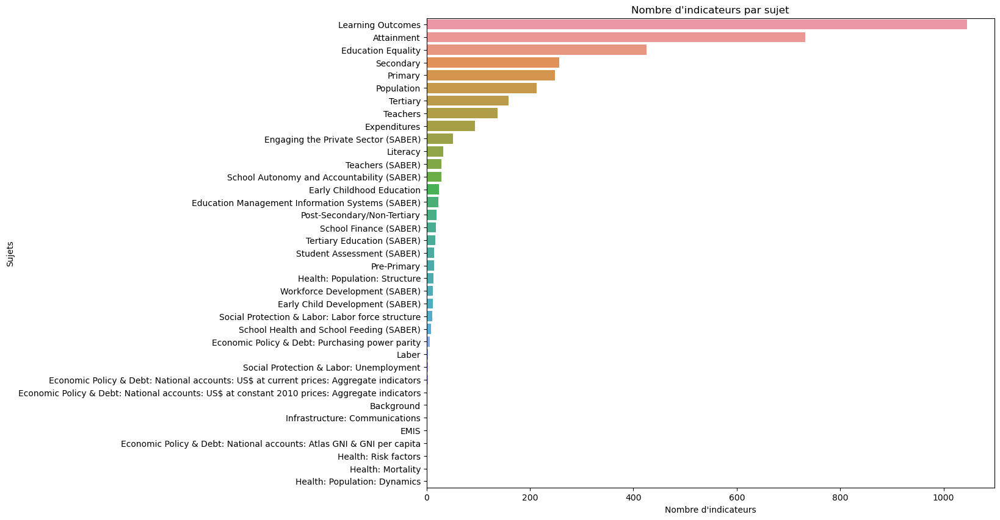

In [58]:
plt.figure(figsize=(12,10))
plt.title("Nombre d'indicateurs par sujet")

sns.barplot(data=tab, x='eff', y='Topic').set(xlabel="Nombre d'indicateurs", ylabel="Sujets")

### Conclusion sur Series

Jeu de données comportant la totalité des indicateurs, leur sujet, leurs définitions, sources, et autres informations à leur égarts.

Il y a un total de 3665 indicateurs.

Beaucoup des informations sont non renseignés, mais les principales le sont (nom, sujet, définition, source). Il n'y a aucun doublon sur les codes indicateurs ou les noms. Des doublons sont présents sur les définitions (longues et courtes).

Le sujet contenant le plus d'indicateur est "Learning Outcomes", qui correspond à des données de niveau en matière scolaire, ce qui ne nous interesse pas pour notre pré-analyse. En revanche, des sujets pertinents pour notre pré-analyse comme Population, Secondary, Tertiary ou Expenditures contiennent un nombre important d'indicateurs. D'autres sujets comme "Infrastructure: Communications" n'en contiennent que très peu (2).

## Data

In [59]:
data.head(10)

,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,...,2060,2065,2070,2075,2080,2085,2090,2095,2100,Unnamed: 69
0,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.F,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.GPI,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Arab World,ARB,"Adjusted net enrolment rate, lower secondary, ...",UIS.NERA.2.M,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Arab World,ARB,"Adjusted net enrolment rate, primary, both sex...",SE.PRM.TENR,54.822121,54.894138,56.209438,57.267109,57.991138,59.365540,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,Arab World,ARB,"Adjusted net enrolment rate, primary, female (%)",SE.PRM.TENR.FE,43.351101,43.318150,44.640701,45.845718,46.449501,48.363892,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,Arab World,ARB,"Adjusted net enrolment rate, primary, gender p...",UIS.NERA.1.GPI,0.658570,0.656400,0.663290,0.672040,0.672610,0.691760,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,Arab World,ARB,"Adjusted net enrolment rate, primary, male (%)",SE.PRM.TENR.MA,65.826233,65.993584,67.301857,68.219078,69.059013,69.914551,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,Arab World,ARB,"Adjusted net enrolment rate, upper secondary, ...",UIS.NERA.3,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,Arab World,ARB,"Adjusted net enrolment rate, upper secondary, ...",UIS.NERA.3.F,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [60]:
data.shape

(886930, 70)

In [61]:
data.dtypes

Country Name       object
Country Code       object
Indicator Name     object
Indicator Code     object
1970              float64
                   ...   
2085              float64
2090              float64
2095              float64
2100              float64
Unnamed: 69       float64
Length: 70, dtype: object

In [62]:
data.describe()

,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,...,2060,2065,2070,2075,2080,2085,2090,2095,2100,Unnamed: 69
count,7.228800e+04,3.553700e+04,3.561900e+04,3.554500e+04,3.573000e+04,8.730600e+04,3.748300e+04,3.757400e+04,3.757600e+04,3.680900e+04,...,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,5.143600e+04,0.0
mean,1.974772e+09,4.253638e+09,4.592365e+09,5.105006e+09,5.401493e+09,2.314288e+09,5.731808e+09,6.124437e+09,6.671489e+09,7.436724e+09,...,7.224868e+02,7.271290e+02,7.283779e+02,7.266484e+02,7.228327e+02,7.176899e+02,7.113072e+02,7.034274e+02,6.940296e+02,NaN
std,1.211687e+11,1.804814e+11,1.914083e+11,2.059170e+11,2.112150e+11,1.375059e+11,2.215546e+11,2.325489e+11,2.473986e+11,2.660957e+11,...,2.215845e+04,2.287990e+04,2.352338e+04,2.408149e+04,2.455897e+04,2.496587e+04,2.530183e+04,2.556069e+04,2.574189e+04,NaN
min,-1.435564e+00,-1.594625e+00,-3.056522e+00,-4.032582e+00,-4.213563e+00,-3.658569e+00,-2.950945e+00,-3.174870e+00,-3.558749e+00,-2.973612e+00,...,-1.630000e+00,-1.440000e+00,-1.260000e+00,-1.090000e+00,-9.200000e-01,-7.800000e-01,-6.500000e-01,-5.500000e-01,-4.500000e-01,NaN
25%,8.900000e-01,8.853210e+00,9.240920e+00,9.595200e+00,9.861595e+00,1.400000e+00,9.312615e+00,9.519913e+00,1.000000e+01,1.000000e+01,...,3.000000e-02,3.000000e-02,2.000000e-02,2.000000e-02,1.000000e-02,1.000000e-02,1.000000e-02,1.000000e-02,1.000000e-02,NaN
50%,6.317724e+00,6.316240e+01,6.655139e+01,6.969595e+01,7.087760e+01,9.677420e+00,7.101590e+01,7.133326e+01,7.290512e+01,7.510173e+01,...,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.300000e-01,2.200000e-01,NaN
75%,6.251250e+01,5.655200e+04,5.863650e+04,6.202900e+04,6.383675e+04,7.854163e+01,5.682800e+04,5.739175e+04,5.940425e+04,6.411500e+04,...,7.505000e+00,7.500000e+00,7.300000e+00,7.100000e+00,6.722500e+00,6.080000e+00,5.462500e+00,4.680000e+00,4.032500e+00,NaN
max,1.903929e+13,1.986457e+13,2.100916e+13,2.238367e+13,2.282991e+13,2.300634e+13,2.424128e+13,2.521383e+13,2.622101e+13,2.730873e+13,...,2.951569e+06,3.070879e+06,3.169711e+06,3.246239e+06,3.301586e+06,3.337871e+06,3.354746e+06,3.351887e+06,3.330484e+06,NaN


In [63]:
data.loc[data[['Country Code', 'Indicator Code']].duplicated(keep=False),:]

,Country Name,Country Code,Indicator Name,Indicator Code,1970,1971,1972,1973,1974,1975,...,2060,2065,2070,2075,2080,2085,2090,2095,2100,Unnamed: 69


In [64]:
data.isna().sum().sum()

53455179

In [65]:
data['Indicator Name'].unique().shape

(3665,)

In [66]:
data['Country Name'].unique().shape

(242,)

In [67]:
list = data.columns[4:-1].tolist()

list

['1970',
 '1971',
 '1972',
 '1973',
 '1974',
 '1975',
 '1976',
 '1977',
 '1978',
 '1979',
 '1980',
 '1981',
 '1982',
 '1983',
 '1984',
 '1985',
 '1986',
 '1987',
 '1988',
 '1989',
 '1990',
 '1991',
 '1992',
 '1993',
 '1994',
 '1995',
 '1996',
 '1997',
 '1998',
 '1999',
 '2000',
 '2001',
 '2002',
 '2003',
 '2004',
 '2005',
 '2006',
 '2007',
 '2008',
 '2009',
 '2010',
 '2011',
 '2012',
 '2013',
 '2014',
 '2015',
 '2016',
 '2017',
 '2020',
 '2025',
 '2030',
 '2035',
 '2040',
 '2045',
 '2050',
 '2055',
 '2060',
 '2065',
 '2070',
 '2075',
 '2080',
 '2085',
 '2090',
 '2095',
 '2100']

In [68]:
data_agreg = data.pivot_table(index=['Country Name'], values=list, columns=['Indicator Name', 'Indicator Code'])

data_agreg

1970  \
Indicator Name     Adjusted net enrolment rate, lower secondary, both sexes (%)   
Indicator Code                                                       UIS.NERA.2   
Country Name                                                                      
Afghanistan                                                       NaN             
Albania                                                           NaN             
Algeria                                                           NaN             
American Samoa                                                    NaN             
Andorra                                                           NaN             
...                                                               ...             
West Bank and Gaza                                                NaN             
World                                                             NaN             
Yemen, Rep.                                                       NaN             
Zambia                                                            NaN             
Zimbabwe                                                          NaN             

                                                                             \
Indicator Name     Adjusted net enrolment rate, lower secondary, female (%)   
Indicator Code                                                 UIS.NERA.2.F   
Country Name                                                                  
Afghanistan                                                       NaN         
Albania                                                           NaN         
Algeria                                                           NaN         
American Samoa                                                    NaN         
Andorra                                                           NaN         
...                                                               ...         
West Bank and Gaza                                                NaN         
World                                                             NaN         
Yemen, Rep.                                                       NaN         
Zambia                                                            NaN         
Zimbabwe                                                          NaN         

                                                                                            \
Indicator Name     Adjusted net enrolment rate, lower secondary, gender parity index (GPI)   
Indicator Code                                                              UIS.NERA.2.GPI   
Country Name                                                                                 
Afghanistan                                                       NaN                        
Albania                                                           NaN                        
Algeria                                                           NaN                        
American Samoa                                                    NaN                        
Andorra                                                           NaN                        
...                                                               ...                        
West Bank and Gaza                                                NaN                        
World                                                             NaN                        
Yemen, Rep.                                                       NaN                        
Zambia                                                            NaN                        
Zimbabwe                                                          NaN                        

                                                                           \
Indicator Name     Adjusted net enrolment rate, lower secondary, male (%)   
Indicator Code                                               UIS.NERA.2.M   
C

In [69]:
data_countries = data_agreg.notna().sum(axis=1).sort_values(ascending=False).reset_index()

data_countries.columns = ['Country Name', 'NofValues']
data_countries.head(10)

,Country Name,NofValues
0,Malta,34422
1,Cyprus,34208
2,Italy,33981
3,Bulgaria,33195
4,Hungary,33046
5,Morocco,32923
6,Niger,32860
7,Mexico,32772
8,Colombia,32483
9,Syrian Arab Republic,32339


In [70]:
data_countries['NofValues'].sum() 

5082201

C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use 

<Axes: xlabel='Country Name', ylabel='NofValues'>

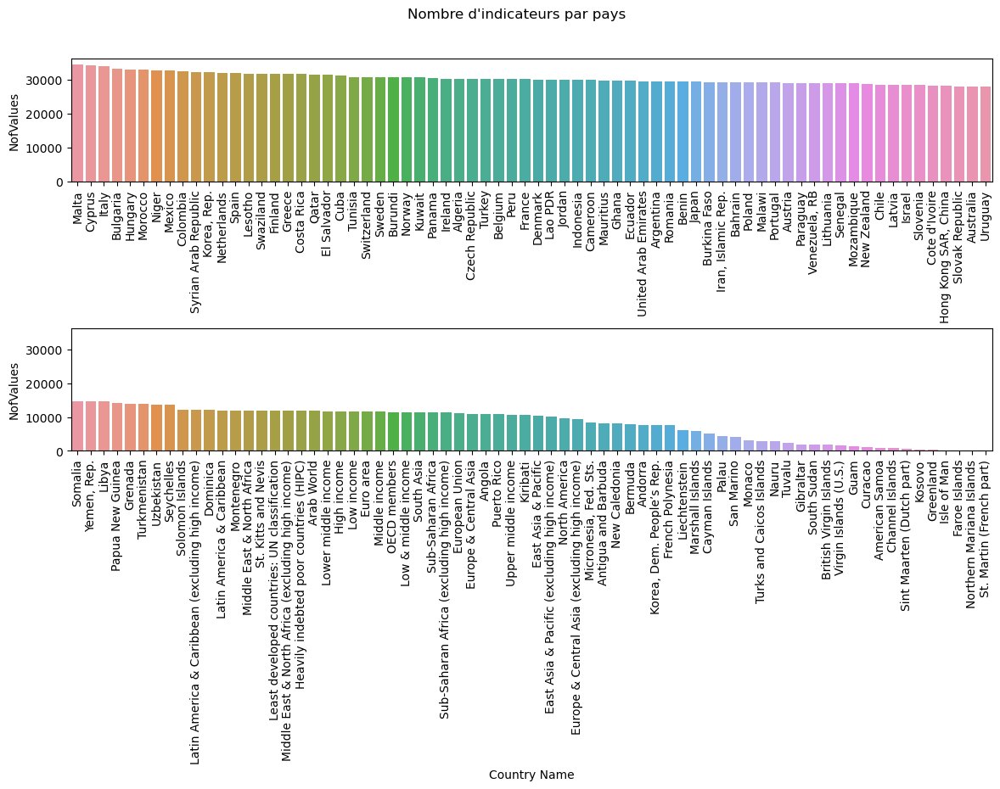

In [71]:
fig, (axe1, axe2) = plt.subplots(2, figsize=(14,6), sharey=True)
fig.suptitle("Nombre d'indicateurs par pays")
plt.subplots_adjust(hspace = 1.2)
axe1.tick_params(axis="x", labelrotation=90)
axe2.tick_params(axis="x", labelrotation=90)
sns.barplot(ax=axe1, data=data_countries.head(70), x='Country Name', y='NofValues')
sns.barplot(ax=axe2, data=data_countries.tail(70), x='Country Name', y='NofValues')

C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


[Text(0.5, 0, 'Années'), Text(0, 0.5, "Nombre d'indicateurs")]

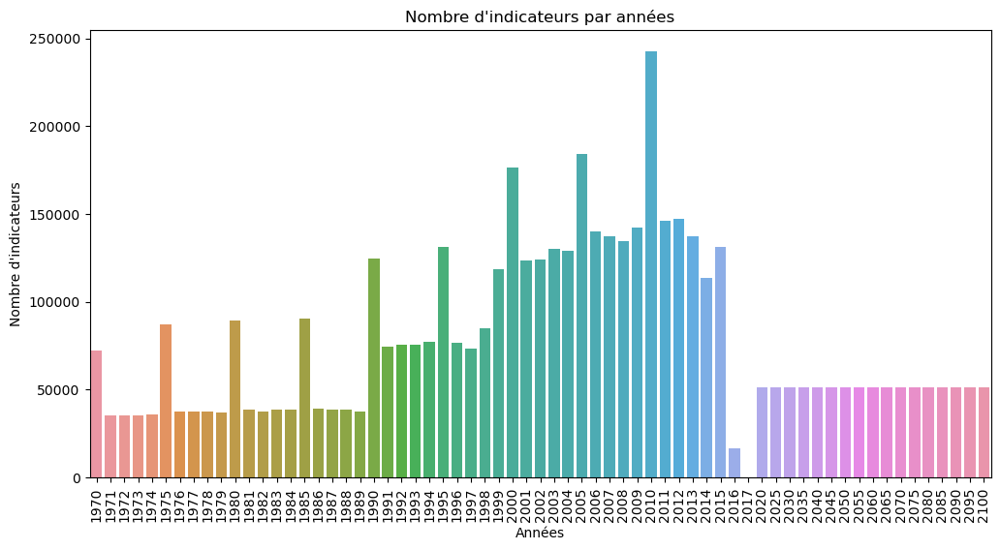

In [72]:
df = {'NofValues': data.iloc[:,4:-1].notna().sum(), 'NofNa': data.iloc[:,4:-1].isna().sum()}
data_year = pd.DataFrame(df).reset_index()
data_year.columns = ['Year', 'NofValues', 'NofNa']

plt.figure(figsize=(12,6))
plt.title("Nombre d'indicateurs par années")
plt.xticks(rotation=90)
sns.barplot(data=data_year, x='Year', y='NofValues').set(xlabel='Années', ylabel="Nombre d'indicateurs")

C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


[Text(0.5, 0, 'Décennies'), Text(0, 0.5, "Nombre d'indicateurs")]

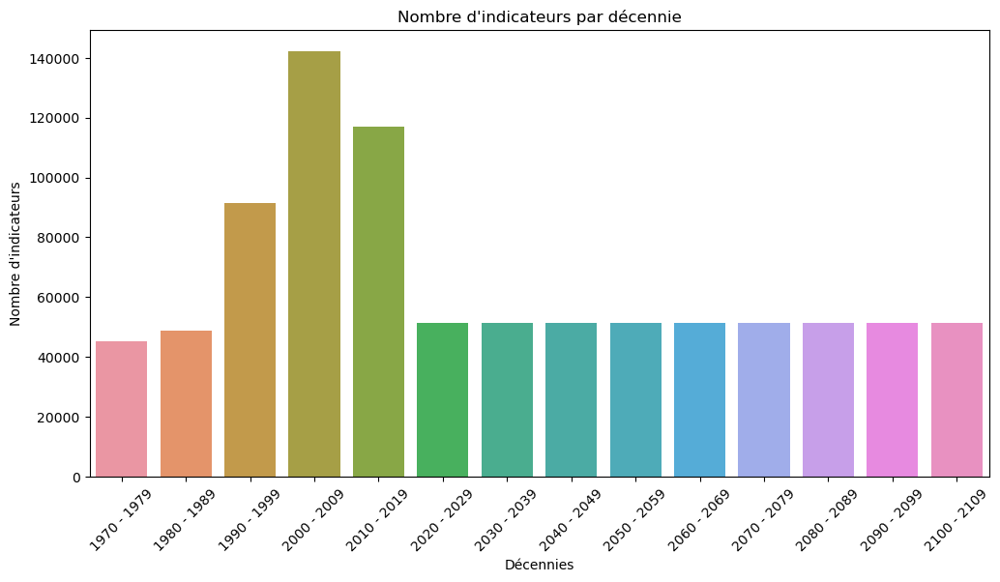

In [73]:
def todecade(y):
  return str(y)[0:3] + '0 - ' + str(y)[0:3] + '9'

data_year['Decade'] =  data_year["Year"].apply(todecade)

plt.figure(figsize=(12,6))
plt.title("Nombre d'indicateurs par décennie")
plt.xticks(rotation=45)
sns.barplot(data=data_year, x='Decade', y='NofValues', errorbar=None).set(xlabel='Décennies', ylabel="Nombre d'indicateurs")

C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use 

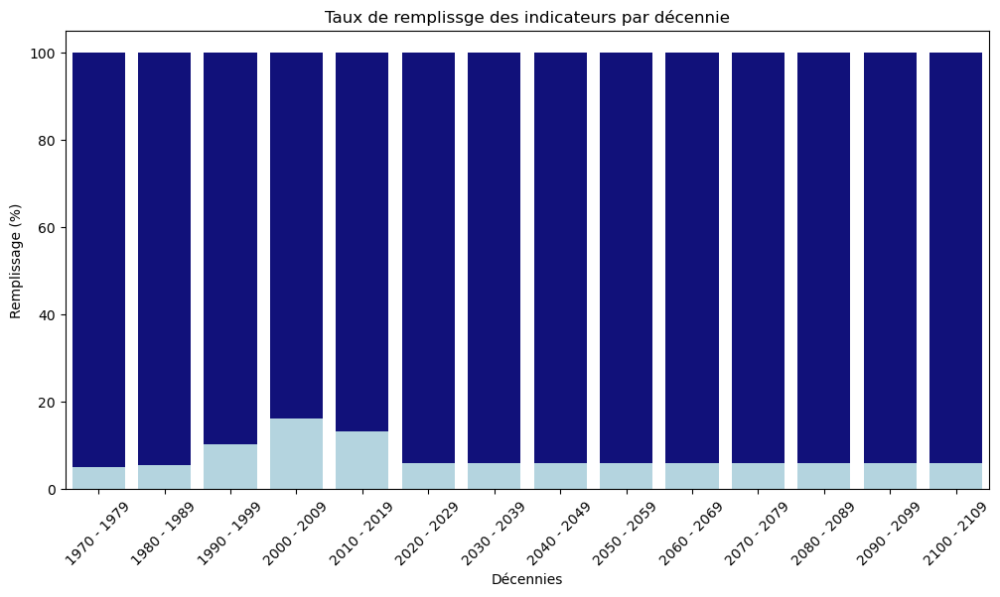

In [74]:
plt.figure(figsize=(12,6))
plt.title("Taux de remplissge des indicateurs par décennie")
plt.xticks(rotation=45)

bar1 = sns.barplot(data=data_year, x="Decade",  y=((data_year['NofNa']+data_year['NofValues'])/886930)*100, color='darkblue', errorbar=None).set(xlabel='Décennies', ylabel="Remplissage (%)")

bar2 = sns.barplot(data=data_year, x="Decade", y=(data_year['NofValues']/886930)*100, color='lightblue', errorbar=None).set(xlabel='Décennies', ylabel="Remplissage (%)")

# show the graph
plt.show()

### Conclusion sur Data

242 pays pour 3665 indicateurs sur 65 dates Soit un total de 57 650 450 données.

Une colonne à supprimer ('Unnamed: 69').  
Aucun doublons sur le couple pays / indicateur.  
Un très grand nombre de données non renseignées. 5 082 201 données renseignées (sur 57 650 450), soit 8.82%.  
La répartition des données par pays est très hétérogène. Certains pays seront donc à exclure par manque de données.  

En regardant la répartition des données en fonction des dates, on constate plusieurs choses :
- Les données projectives sont renseignées équitablement
- L'année 2010 est la plus renseignée
- L'année 2017 n'est pas renseignée (à exclure)
- Il y a un pic de renseignement tout les 5 ans
- La période 2010 - 2015 semble la plus pertinente (grosse proportion de données, assez récentes)

# Selections des indicateurs clés

- Pré-sélection des indicateurs en fonction des sujets dans le jeu "series"
- Vérification du taux de renseignement de ces indicateurs dans le jeu "data"
- Selection des indicateurs pertinent

### Recherche par des mots clés :
    - Population
    - Secondary
    - Tertiary
    - GDP
    - Infrastructure

In [75]:
series.loc[series["Topic"].str.contains('Infrastructure'), ['Indicator Name','Series Code']]

,Indicator Name,Series Code
610,Personal computers (per 100 people),IT.CMP.PCMP.P2
611,Internet users (per 100 people),IT.NET.USER.P2


In [76]:
series.loc[series["Series Code"].str.contains('SP.POP.15'), ['Indicator Name','Series Code']]

,Indicator Name,Series Code
2504,"Population, ages 15-24, female",SP.POP.1524.FE.UN
2505,"Population, ages 15-24, male",SP.POP.1524.MA.UN
2506,"Population, ages 15-24, total",SP.POP.1524.TO.UN
2507,"Population ages 15-64, female",SP.POP.1564.FE.IN
2508,"Population ages 15-64, male",SP.POP.1564.MA.IN
2509,"Population ages 15-64, total",SP.POP.1564.TO
2510,Population ages 15-64 (% of total),SP.POP.1564.TO.ZS


In [77]:
series.loc[series["Indicator Name"].str.contains('GDP'), ['Indicator Name','Series Code', 'Long definition']].head()

,Indicator Name,Series Code,Long definition
1658,GDP (current US$),NY.GDP.MKTP.CD,GDP at purchaser's prices is the sum of gross ...
1659,GDP (constant 2010 US$),NY.GDP.MKTP.KD,GDP at purchaser's prices is the sum of gross ...
1660,"GDP, PPP (current international $)",NY.GDP.MKTP.PP.CD,PPP GDP is gross domestic product converted to...
1661,"GDP, PPP (constant 2011 international $)",NY.GDP.MKTP.PP.KD,PPP GDP is gross domestic product converted to...
1662,GDP per capita (current US$),NY.GDP.PCAP.CD,GDP per capita is gross domestic product divid...


#### Indicateurs pré-selectionnés :
- SP.POP.TOTL
- SP.POP.1524.TO.UN
- NY.GDP.PCAP.PP.CD
- SE.SEC.ENRL
- SE.SEC.ENRR
- SE.TER.ENRL
- SE.TER.ENRR
- IT.CMP.PCMP.P2
- IT.NET.USER.P2

On vérifie le taux de remplissage des indicateurs sur les années qui nous intéressent, afin d'affiner notre séléction.

C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use 

[Text(0.5, 0, 'années'), Text(0, 0.5, 'Remplissage (%)')]

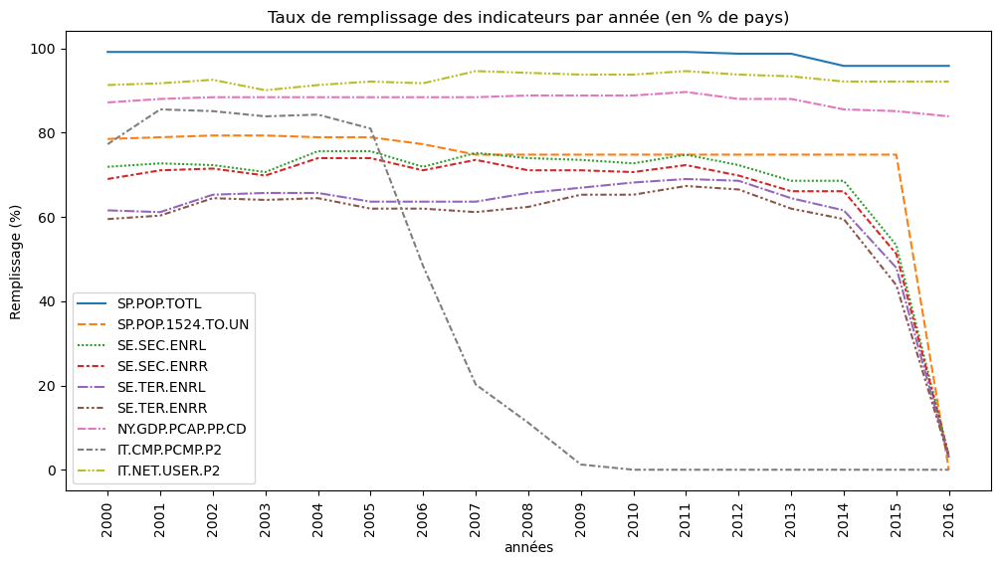

In [78]:

pop_tot = (data.loc[data['Indicator Code'] == 'SP.POP.TOTL', :].iloc[:,4:-10].notna().sum() / 242) *100
selected_indic = pd.DataFrame(pop_tot, columns=['SP.POP.TOTL'])
selected_indic['SP.POP.1524.TO.UN'] = (data.loc[data['Indicator Code'] == 'SP.POP.1524.TO.UN', :].iloc[:,4:-10].notna().sum() / 242) *100
selected_indic['SE.SEC.ENRL'] = (data.loc[data['Indicator Code'] == 'SE.SEC.ENRL', :].iloc[:,4:-10].notna().sum() / 242) *100
selected_indic['SE.SEC.ENRR'] = (data.loc[data['Indicator Code'] == 'SE.SEC.ENRR', :].iloc[:,4:-10].notna().sum() / 242) *100
selected_indic['SE.TER.ENRL'] = (data.loc[data['Indicator Code'] == 'SE.TER.ENRL', :].iloc[:,4:-10].notna().sum() / 242) *100
selected_indic['SE.TER.ENRR'] = (data.loc[data['Indicator Code'] == 'SE.TER.ENRR', :].iloc[:,4:-10].notna().sum() / 242) *100
selected_indic['NY.GDP.PCAP.PP.CD'] = (data.loc[data['Indicator Code'] == 'NY.GDP.PCAP.PP.CD', :].iloc[:,4:-10].notna().sum() / 242) *100
selected_indic['IT.CMP.PCMP.P2'] = (data.loc[data['Indicator Code'] == 'IT.CMP.PCMP.P2', :].iloc[:,4:-10].notna().sum() / 242) *100
selected_indic['IT.NET.USER.P2'] = (data.loc[data['Indicator Code'] == 'IT.NET.USER.P2', :].iloc[:,4:-10].notna().sum() / 242) *100

plt.figure(figsize=(12,6))
plt.title('Taux de remplissage des indicateurs par année (en % de pays)')
plt.xticks(rotation=90)
sns.lineplot(data=selected_indic.iloc[30:47,:]).set(xlabel='années', ylabel='Remplissage (%)')

Plusieurs conclusions ressortent de ce graphique :
- IT.CMP.PCMP.P2 n'est quasiment plus renseigné à partir de 2009 => on ne retiendra pas cet indicateur
- Beaucoup d'indicateurs ne sont pas renseignés en 2016 => on peut exclure cette date de notre pré-analyse
- Environ 35% des pays ne renseignent pas les informations sur le tertiaire
- L'indicateur ENRL est mieux renseigné que le ENRR pour le secondaire comme pour le tertiaire. On sélectionne donc plutot cet indicateur.

Indicateurs selectionnés :
- SP.POP.TOTL : Population Totale
- SP.POP.1524.TO.UN : Population totale dont l'age est compris entre 15 et 24 ans
- NY.GDP.PCAP.PP.CD : PIB par habitant avec parité de pouvoir d'achat ($ international actuel)
- SE.SEC.ENRL : Total d'étudiants en secondaire, sans distinction d'age
- SE.TER.ENRL : Total d'étudiants en tertiaire, sans distinction d'age
- IT.NET.USER.P2 : Utilisateur d'internet au cours des 3 derniers mois (en % de la p

Etapes suivantes :
- Filtrer le jeu de données sur les dates et les indicateurs concernés
- Supprimer les code alpha 3 qui ne sont pas des pays (régions, continents, ...)
- Regarder le taux de remplissage de chaque indicateur par pays, et supprimer les moins renseignés (- de 70%)
- Regarder combien de pays il reste
- Etablir des valeurs seuils sur certains indicateurs (population, PIB, ...)

## Filtrage et suppression alpha-3

In [79]:
# Filtrage des données sur la période 2010-2015
filtered = data.drop(columns=data_year['Year'].iloc[0:40])
filtered.drop(columns=data_year['Year'].iloc[46:], inplace=True)
filtered.drop(columns='Unnamed: 69', inplace=True)

# Filtrage des indicateurs sur ceux selectionnés via un mask
INDIC = selected_indic.drop(columns=['SE.SEC.ENRR','SE.TER.ENRR','IT.CMP.PCMP.P2']).columns
mask_indic = filtered['Indicator Code'].isin(INDIC)
filtered = filtered.loc[mask_indic, :]

# Suppression des codes alpha 3 qui ne sont pas des pays en se basant sur le jeu de données Country
COUNTRIES = countrySeries['CountryCode']
mask_countries = filtered['Country Code'].isin(COUNTRIES)
filtered = filtered.loc[mask_countries,:]

## Taux de remplissage des indicateurs

In [80]:
# Taux de remplissage de chaque indicateur par pays
country_filling = filtered.groupby(['Country Name', 'Indicator Code'])[filtered.columns[4:].tolist()].count().sum(axis=1)/6*100
country_filling = country_filling.reset_index().rename(columns={0: 'Filling'})
country_filling

,Country Name,Indicator Code,Filling
0,Afghanistan,IT.NET.USER.P2,100.000000
1,Afghanistan,NY.GDP.PCAP.PP.CD,100.000000
2,Afghanistan,SE.SEC.ENRL,100.000000
3,Afghanistan,SE.TER.ENRL,33.333333
4,Afghanistan,SP.POP.1524.TO.UN,100.000000
...,...,...,...
1261,Zimbabwe,NY.GDP.PCAP.PP.CD,100.000000
1262,Zimbabwe,SE.SEC.ENRL,33.333333
1263,Zimbabwe,SE.TER.ENRL,83.333333
1264,Zimbabwe,SP.POP.1524.TO.UN,100.000000


In [81]:
# On ne garde que les pays dont les indicateurs ont un minimum de 70% de remplissage. 
# 130 pays s'en retrouvent supprimés, dont le Canada et l'Allemagne.
country_filtered = country_filling['Country Name'].loc[country_filling['Filling'] < 70].unique()
mask_filling = filtered['Country Name'].isin(country_filtered)
filtered = filtered.loc[~mask_filling, :]

In [82]:
pop_totl = filtered.loc[filtered['Indicator Code'] == 'SP.POP.TOTL', :].reset_index(drop=True)
pop_1524 = filtered.loc[filtered['Indicator Code'] == 'SP.POP.1524.TO.UN', :].reset_index(drop=True)
gdp_pcap = filtered.loc[filtered['Indicator Code'] == 'NY.GDP.PCAP.PP.CD', :].reset_index(drop=True)
sec_enrl = filtered.loc[filtered['Indicator Code'] == 'SE.SEC.ENRL', :].reset_index(drop=True)
ter_enrl = filtered.loc[filtered['Indicator Code'] == 'SE.TER.ENRL', :].reset_index(drop=True)
net_user = filtered.loc[filtered['Indicator Code'] == 'IT.NET.USER.P2', :].reset_index(drop=True)

In [83]:
filtered.pivot_table(index='Country Name', values='2015', columns="Indicator Code").describe()

Indicator Code,IT.NET.USER.P2,NY.GDP.PCAP.PP.CD,SE.SEC.ENRL,SE.TER.ENRL,SP.POP.1524.TO.UN,SP.POP.TOTL
count,81.000000,81.000000,7.000000e+01,7.000000e+01,8.100000e+01,8.100000e+01
mean,61.010793,26777.550134,5.234234e+06,2.247159e+06,1.032687e+07,6.595704e+07
std,23.672278,22971.838165,1.863801e+07,6.795849e+06,3.505883e+07,2.121701e+08
min,4.866224,798.507984,1.321500e+04,2.788000e+03,2.986900e+04,1.772060e+05
25%,45.334976,10771.326601,2.669492e+05,1.087050e+05,5.562690e+05,4.182341e+06
50%,67.300000,22602.188383,6.389790e+05,2.965463e+05,1.148782e+06,9.799186e+06
75%,77.634700,36506.725033,2.304793e+06,7.777935e+05,5.703349e+06,4.341776e+07
max,96.810300,127764.462337,1.295421e+08,4.336739e+07,2.441202e+08,1.371220e+09


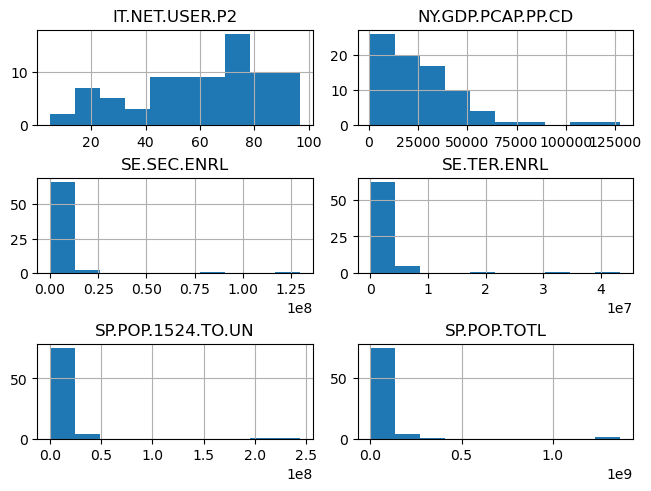

In [84]:
plt.rcParams['figure.constrained_layout.use'] = True
fig = filtered.pivot_table(index='Country Name', values='2015', columns="Indicator Code").hist()

## Définition de valeurs seuil (sur population & PIB)

### Analyse de la Population Totale

In [85]:
pop_totl.isna().sum()

Country Name      0
Country Code      0
Indicator Name    0
Indicator Code    0
2010              0
2011              0
2012              0
2013              0
2014              0
2015              0
dtype: int64

In [86]:
pop_totl['2015'].describe()

count    8.100000e+01
mean     6.595704e+07
std      2.121701e+08
min      1.772060e+05
25%      4.182341e+06
50%      9.799186e+06
75%      4.341776e+07
max      1.371220e+09
Name: 2015, dtype: float64

[Text(0.5, 0, 'Population (en milliards)')]

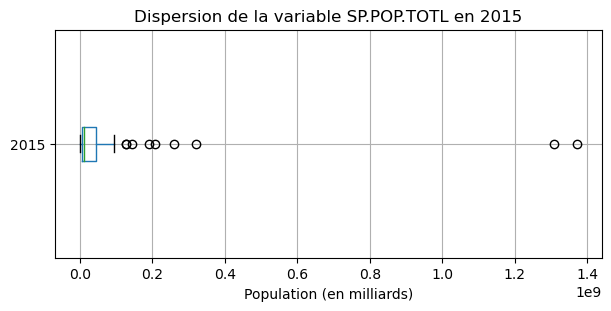

In [87]:
plt.figure(figsize=(6,3))
plt.title('Dispersion de la variable SP.POP.TOTL en 2015')
pop_totl.boxplot(column='2015', vert=False).set(xlabel="Population (en milliards)")

In [88]:
pop_totl['2015'].skew()

5.585096162298801

C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use 

<Axes: ylabel='Count'>

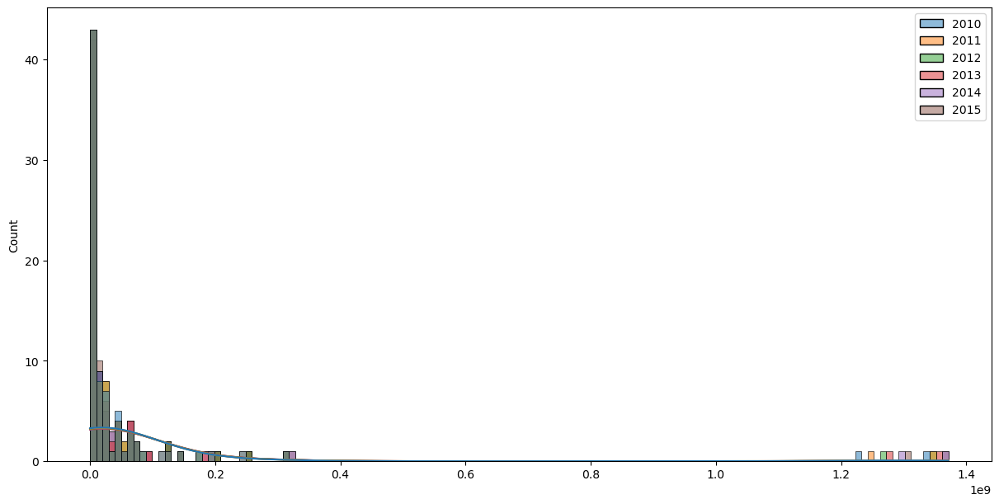

In [89]:
plt.figure(figsize=(12,6))
sns.histplot(data=pop_totl, kde=True)

#### Conclusion
Population totale par pays en 2015 très étalée, avec des outliers importants en nombre et en taille. Il conviendrait d'établir le <b>seuil à la médiane</b> afin de ne pas supprimer un trop grand nombre de pays

### Analyse du PIB

In [90]:
gdp_pcap.isna().sum()

Country Name      0
Country Code      0
Indicator Name    0
Indicator Code    0
2010              0
2011              0
2012              0
2013              0
2014              0
2015              0
dtype: int64

In [91]:
gdp_pcap['2015'].describe()

count        81.000000
mean      26777.550134
std       22971.838165
min         798.507984
25%       10771.326601
50%       22602.188383
75%       36506.725033
max      127764.462337
Name: 2015, dtype: float64

In [92]:
gdp_pcap['2015'].skew()

1.8508390597560458

[Text(0.5, 0, 'PIB')]

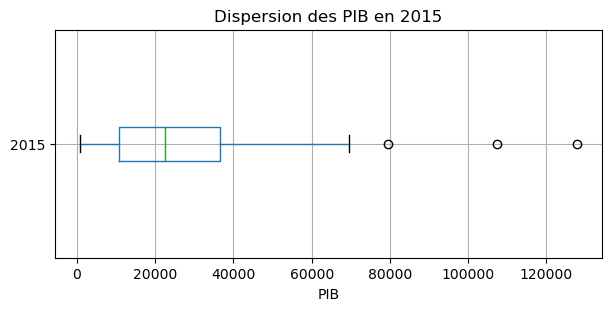

In [93]:
plt.figure(figsize=(6,3))
plt.title('Dispersion des PIB en 2015')
gdp_pcap.boxplot(column='2015', vert=False).set(xlabel="PIB")

C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use 

<Axes: ylabel='Count'>

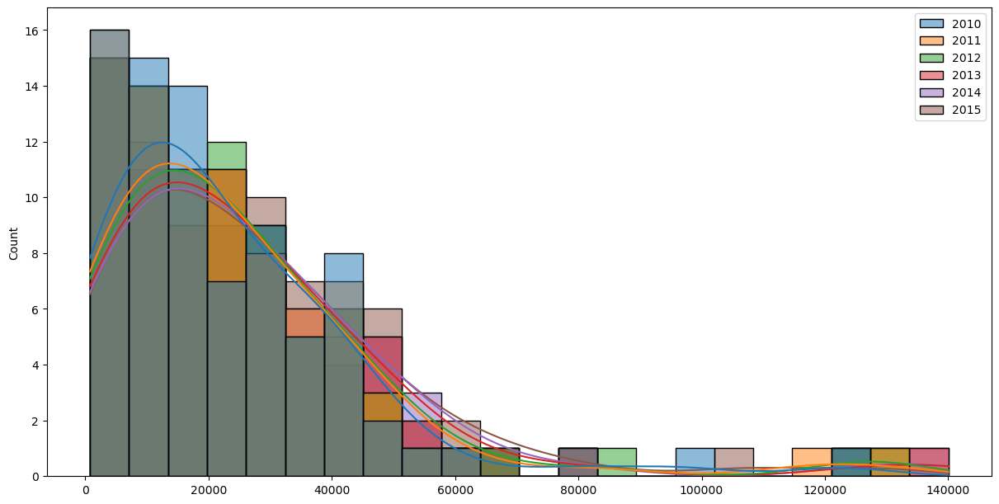

In [94]:
plt.figure(figsize=(12,6))
sns.histplot(data=gdp_pcap, kde=True)

#### Conclusion
PIB 2015 assez étalée, avec des outliers non négligeables en nombre et en taille. Il conviendrait d'établir le <b>seuil à la médiane</b> afin de ne pas supprimer un trop grand nombre de pays

## Réduction par seuils sur Population & PIB

In [95]:
# On ne garde que les pays qui ont plus d'habitants que la valeur médiane de 2015, 
# et dont le PIB est supérieur à la médiane de 2015
pop_totl_filtered = pop_totl.loc[pop_totl['2015'] >= pop_totl['2015'].median()]
gdp_pcap_filtered = gdp_pcap.loc[gdp_pcap['2015'] >= gdp_pcap['2015'].median()]

In [96]:
filtered = filtered.loc[(filtered['Country Name'].isin(pop_totl_filtered['Country Name'])) & (filtered['Country Name'].isin(gdp_pcap_filtered['Country Name'])),:]

In [97]:
filtered['Country Name'].unique().tolist()

['Australia',
 'Belgium',
 'Chile',
 'Czech Republic',
 'France',
 'Greece',
 'Hungary',
 'Italy',
 'Japan',
 'Kazakhstan',
 'Korea, Rep.',
 'Malaysia',
 'Poland',
 'Portugal',
 'Russian Federation',
 'Spain',
 'Sweden',
 'Turkey',
 'United Kingdom',
 'United States']

Next step :
- Créer un df avec les valeurs les plus récentes par pays pour chaque indicateur
- Passer chaque indicateur en pourcentage
- Etablir un score moyen par pays
- Faire des stats / graph par pays (et par région ?)
- Faire des projections sur les populations plus jeunes pour les pays retenus
- Conclusions sur la stratégie et sur la solidité des analyses

In [98]:
# Création d'une colonne 'last' comprennant les dernières valeurs renseignées pour chaque pays / indicateur

filtered['last'] = np.nan
cp = filtered
cp = cp.ffill(axis=1)
filtered['last'] = cp['last']

filtered['last'] = pd.to_numeric(filtered['last'], errors='coerce')

last_datas = filtered.pivot_table(index='Country Name', values='last', columns="Indicator Code")
last_datas

Indicator Code,IT.NET.USER.P2,NY.GDP.PCAP.PP.CD,SE.SEC.ENRL,SE.TER.ENRL,SP.POP.1524.TO.UN,SP.POP.TOTL
Country Name,,,,,,
Australia,84.560519,46475.927752,2371284.0,1453521.00,2914620.0,23789338.0
Belgium,85.052900,45629.352069,1217912.0,504745.00,1241946.0,11274196.0
Chile,64.289000,23579.462274,1546323.0,1221774.00,2817084.0,17762681.0
Czech Republic,75.668839,34048.186972,770437.0,395529.00,1063674.0,10546059.0
France,84.694500,41178.141819,5947212.0,2388880.00,7567872.0,66624068.0
Greece,66.835000,26450.131614,667718.0,677429.00,1114005.0,10820883.0
Hungary,72.834700,26688.990392,826626.0,307729.00,1123703.0,9843028.0
Italy,58.141735,37407.163565,4606017.0,1826477.00,5703349.0,60730582.0
Japan,91.058028,40686.024386,7227485.0,3862460.00,12157426.0,127141000.0


In [99]:
last_prct = last_datas.copy()

# PIB en % normalisé sur le max
last_prct['NY.GDP.PCAP.PP.CD'] = last_datas['NY.GDP.PCAP.PP.CD']/last_datas['NY.GDP.PCAP.PP.CD'].max()*100

# Nb en secondaire en % des 15-24 ans
last_prct['SE.SEC.ENRL'] = last_datas['SE.SEC.ENRL']/last_datas['SP.POP.1524.TO.UN']*100

# Nb en tertiaire en % des 15-24 ans
last_prct['SE.TER.ENRL'] = last_datas['SE.TER.ENRL']/last_datas['SP.POP.1524.TO.UN']*100

# 15-24 ans en % de population totale
last_prct['SP.POP.1524.TO.UN'] = last_datas['SP.POP.1524.TO.UN']/last_datas['SP.POP.TOTL']*100

# Population totale en % normalisé sur le max
last_prct['SP.POP.TOTL'] = last_datas['SP.POP.TOTL']/last_datas['SP.POP.TOTL'].max()*100

# Score total : moyenne des scores précédents
last_prct['Score'] = last_prct.mean(axis=1)
last_prct = last_prct.sort_values(by="Score",ascending=False).reset_index()
last_prct

Indicator Code,Country Name,IT.NET.USER.P2,NY.GDP.PCAP.PP.CD,SE.SEC.ENRL,SE.TER.ENRL,SP.POP.1524.TO.UN,SP.POP.TOTL,Score
0,United States,74.554202,100.000000,53.668015,43.262020,14.069178,100.000000,64.258903
1,Belgium,85.052900,80.804237,98.064811,40.641461,11.015828,3.513342,53.182097
2,Australia,84.560519,82.303424,81.358256,49.870000,12.251791,7.413396,52.959564
3,United Kingdom,92.000300,74.597824,84.808547,30.432983,11.871115,20.295901,52.334445
4,Japan,91.058028,72.050183,59.449138,31.770376,9.562160,39.620548,50.585072
5,Sweden,90.610200,85.069387,74.383047,37.764615,11.580666,3.053689,50.410267
6,France,84.694500,72.921665,78.584997,31.566073,11.359066,20.761848,49.981358
7,Spain,78.689600,61.692144,77.305779,45.824586,9.227030,14.474349,47.868915
8,"Korea, Rep.",89.648631,60.956585,52.609524,50.616714,12.656214,15.897627,47.064216
9,Russian Federation,73.410000,41.974961,64.006413,44.962646,10.175088,44.904453,46.572260


C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


<Axes: title={'center': 'Score final par pays'}, xlabel='Country Name', ylabel='Score'>

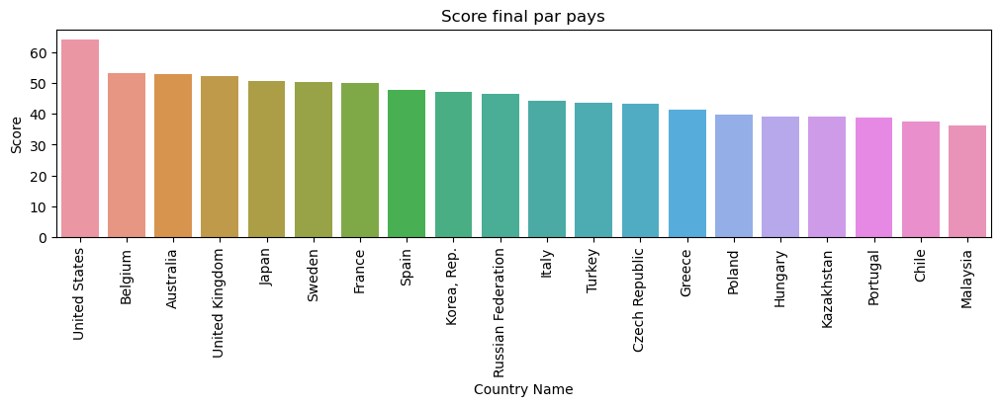

In [100]:
plt.figure(figsize=(10,4))
plt.xticks(rotation= 90)
plt.title('Score final par pays')
sns.barplot(data=last_prct, x='Country Name', y='Score')

In [101]:
merge_country = country.loc[country['Table Name'].isin(last_prct['Country Name']), ['Table Name','Region','Income Group']]
last_prct = last_prct.merge(merge_country, left_on='Country Name', right_on='Table Name', how='inner').drop(columns=['Table Name'])

<Axes: title={'center': 'Scores (%) par indicateur par pays'}, ylabel='Country Name'>

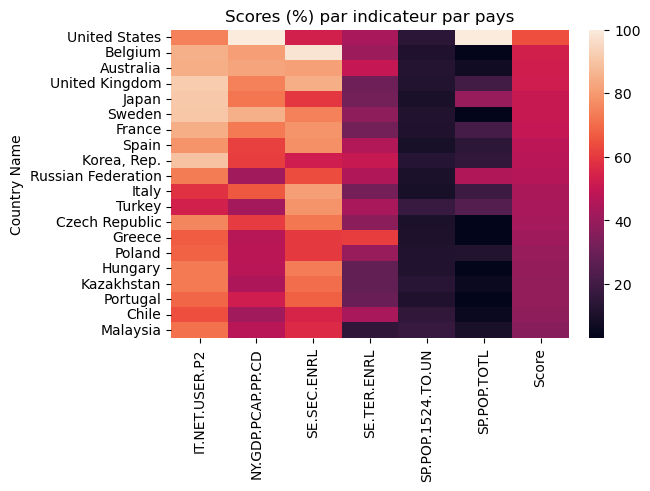

In [102]:
country_score = last_prct.pivot_table(index="Country Name", values=last_prct.columns[1:8].tolist()).sort_values(by='Score', ascending=False)
plt.title("Scores (%) par indicateur par pays")
sns.heatmap(country_score)

<Axes: title={'center': 'Scores (%) par indicateur par région'}, ylabel='Region'>

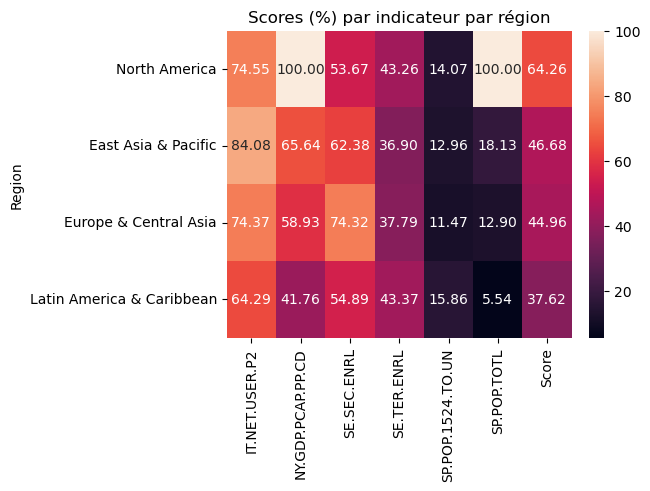

In [103]:
region_score = last_prct.pivot_table(index="Region", values=last_prct.columns[1:8].tolist(), aggfunc='mean').sort_values(by='Score', ascending=False)
plt.title("Scores (%) par indicateur par région")
sns.heatmap(region_score, annot=True, fmt=".2f")

C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


[Text(0.5, 0, 'Catégorie de richesse'), Text(0, 0.5, 'Nombre de pays')]

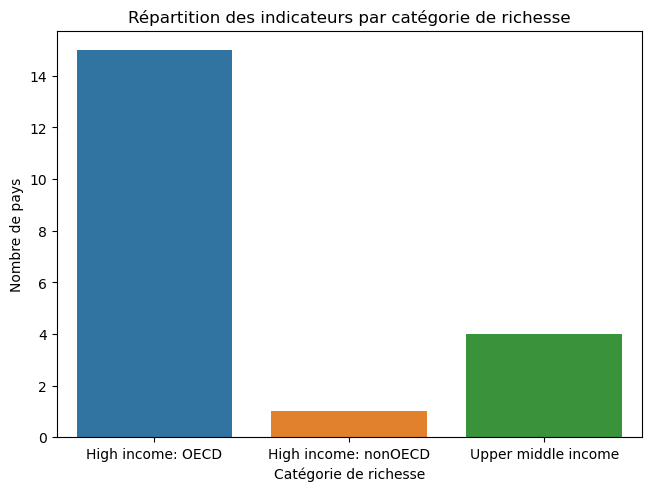

In [104]:
plt.title('Répartition des indicateurs par catégorie de richesse')
sns.barplot(data=last_prct.groupby('Income Group')['Country Name'].count().reset_index(), x='Income Group', y='Country Name').set(xlabel="Catégorie de richesse", ylabel="Nombre de pays")

[Text(0.5, 0, 'IT.NET.USER.P2'),
 Text(1.5, 0, 'NY.GDP.PCAP.PP.CD'),
 Text(2.5, 0, 'SE.SEC.ENRL'),
 Text(3.5, 0, 'SE.TER.ENRL'),
 Text(4.5, 0, 'SP.POP.1524.TO.UN'),
 Text(5.5, 0, 'SP.POP.TOTL'),
 Text(6.5, 0, 'Score')]

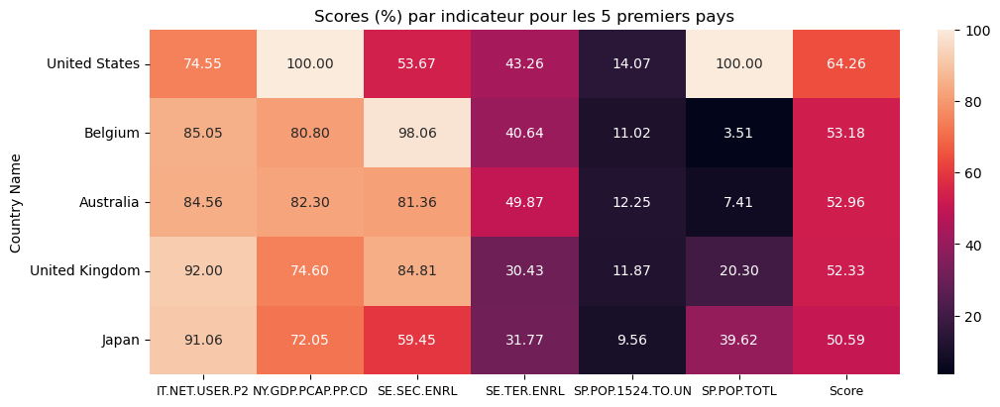

In [105]:
plt.figure(figsize=(10,4))
plt.title("Scores (%) par indicateur pour les 5 premiers pays")
g = sns.heatmap(country_score.iloc[0:5,:], annot=True, fmt=".2f")
g.set_yticklabels(g.get_yticklabels(), rotation = 0, fontsize = 10)
g.set_xticklabels(g.get_xticklabels(), rotation = 0, fontsize = 9)

## Projections
Afin de connaitre l'évolution du potentiel de clients des pays sélectionnés, nous allons nous pencher sur deux solutions :
- Exploitation des données projectives de l'étude Wittgenstein du jeu de données Data
- Exploitation des indicateurs SP.POP.0014.TO, SE.PRE.ENRL, SE.PRE.ENRR, SE.PRM.ENRL et SE.PRM.ENRR

### Etude projective
Etapes :
- Vérifier que les indicateurs de projections sont renseignés pour nos 5 pays sélectionnés
- Regarder si certains indicateurs peuvent nous intéresser

In [106]:
data.loc[(data['Country Name'].isin(last_prct['Country Name'].iloc[0:5])) & (data['Indicator Name'].str.contains('Wittgenstein')),:].isna().sum().tail(20)

2016           1540
2017           1540
2020              0
2025              0
2030              0
2035              0
2040              0
2045              0
2050              0
2055              0
2060              0
2065              0
2070              0
2075              0
2080              0
2085              0
2090              0
2095              0
2100              0
Unnamed: 69    1540
dtype: int64

In [107]:
data.loc[(data['Country Name'].isin(last_prct['Country Name'].iloc[0:5])) & data['Indicator Code'].str.contains('PRJ.'), 'Indicator Name'].unique().tolist()

['Wittgenstein Projection: Mean years of schooling. Age 0-19. Female',
 'Wittgenstein Projection: Mean years of schooling. Age 0-19. Male',
 'Wittgenstein Projection: Mean years of schooling. Age 0-19. Total',
 'Wittgenstein Projection: Mean years of schooling. Age 15+. Female',
 'Wittgenstein Projection: Mean Years of Schooling. Age 15+. Gender Gap',
 'Wittgenstein Projection: Mean years of schooling. Age 15+. Male',
 'Wittgenstein Projection: Mean years of schooling. Age 15+. Total',
 'Wittgenstein Projection: Mean years of schooling. Age 15-19. Female',
 'Wittgenstein Projection: Mean years of schooling. Age 15-19. Male',
 'Wittgenstein Projection: Mean years of schooling. Age 15-19. Total',
 'Wittgenstein Projection: Mean years of schooling. Age 20-24. Female',
 'Wittgenstein Projection: Mean years of schooling. Age 20-24. Male',
 'Wittgenstein Projection: Mean years of schooling. Age 20-24. Total',
 'Wittgenstein Projection: Mean years of schooling. Age 20-39. Female',
 'Wittgenst

Tous les indicateurs sont bien renseignés.  
Seulement 3 types d'informations disponibles (pour chaque tranche d'age et niveau scolaire):
- Mean years of schooling.
- Percentage of the total population by highest level of educational attainment.
- Population in thousands by highest level of educational attainment.

Aucune ne nous intéresse pour connaitre l'évolution sur le potentiel de client des pays sélectionnés.

### Indicateurs primaires

Etape :
- Vérifier que les indicateurs sont renseignés pour les pays sélectionnés
- Regarder le taux de remplissage des indicateurs pour choisir les plus pertinents (ENRL & ENRR)
- Analyser

In [108]:
predic = data.copy()
predic = predic[['Country Name', 'Indicator Name', 'Indicator Code', '2010','2011','2012','2013','2014','2015','2016']]
indic = ['SP.POP.TOTL', 'SP.POP.0014.TO', 'SE.PRE.ENRL', 'SE.PRE.ENRR', 'SE.PRM.ENRL', 'SE.PRM.ENRR']
mask_indic = predic['Indicator Code'].isin(indic)
mask_last = predic['Country Name'].isin(last_prct['Country Name'])

predic = predic.loc[mask_indic,:]
predic = predic.loc[mask_last, :]

predic.isna().sum()

Country Name       0
Indicator Name     0
Indicator Code     0
2010              10
2011               6
2012               4
2013               0
2014               0
2015              20
2016              76
dtype: int64

In [109]:
predic_filling = predic.groupby('Indicator Code')[predic.columns[3:].tolist()].count() / 20 *100
predic_filling.reset_index()
predic_filling = predic_filling.pivot_table(columns='Indicator Code')
predic_filling

Indicator Code,SE.PRE.ENRL,SE.PRE.ENRR,SE.PRM.ENRL,SE.PRM.ENRR,SP.POP.0014.TO,SP.POP.TOTL
2010,80.0,80.0,95.0,95.0,100.0,100.0
2011,85.0,85.0,100.0,100.0,100.0,100.0
2012,90.0,90.0,100.0,100.0,100.0,100.0
2013,100.0,100.0,100.0,100.0,100.0,100.0
2014,100.0,100.0,100.0,100.0,100.0,100.0
2015,75.0,75.0,75.0,75.0,100.0,100.0
2016,5.0,5.0,5.0,5.0,100.0,100.0


C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\octav\anaconda3\envs\env_projet2\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use 

[Text(0.5, 0, 'Années'), Text(0, 0.5, 'Remplissage (%)')]

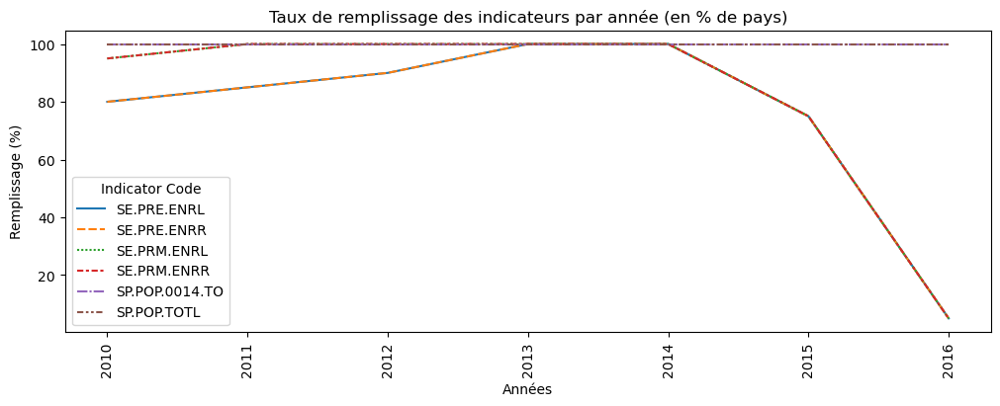

In [110]:
plt.figure(figsize=(10,4))
plt.title('Taux de remplissage des indicateurs par année (en % de pays)')
plt.xticks(rotation=90)
sns.lineplot(data=predic_filling).set(xlabel="Années", ylabel="Remplissage (%)")

Les indicateurs ENRR et ENRL étant renseignés dans les mêmes proportions, nous prendront SE.PRE.ENRR, qui est directement en % de la population

In [111]:
# Filtrage des indicateurs sur ceux selectionnés via un mask
mask_indic = predic['Indicator Code'].isin(['SE.PRE.ENRL','SE.PRM.ENRL'])
predic = predic.loc[~mask_indic, :]

# Création d'une colonne 'last' comprennant les dernières valeurs renseignées pour chaque pays / indicateur
predic['last']= float('NaN')
cp = predic
cp = cp.ffill(axis=1)
predic['last'] = cp['last']
predic['last'] = pd.to_numeric(predic['last'], errors='coerce')

last_predic = predic.pivot_table(index='Country Name', values='last', columns="Indicator Code")

last_predic['SP.POP.0014.TO'] = last_predic['SP.POP.0014.TO'] / last_predic['SP.POP.TOTL'] *100
last_predic['SP.POP.TOTL'] = last_predic['SP.POP.TOTL'] / last_predic['SP.POP.TOTL'].max() *100

last_predic['Score'] = last_predic.mean(axis=1)
last_predic.sort_values(by='Score', ascending=False)

Indicator Code,SE.PRE.ENRR,SE.PRM.ENRR,SP.POP.0014.TO,SP.POP.TOTL,Score
Country Name,,,,,
United States,70.839081,100.147041,19.028231,100.000000,72.503588
Australia,124.919983,102.207817,18.898305,7.466761,63.373216
France,108.806732,105.358360,18.174278,20.702697,63.260517
Russian Federation,86.968201,100.521111,17.291970,44.670413,62.362924
Japan,89.252678,101.224648,12.935748,39.301671,60.678686
Belgium,116.403008,104.192978,17.031238,3.511975,60.284800
Sweden,93.936577,123.019188,17.399594,3.064772,59.355033
United Kingdom,88.222710,108.240211,17.618800,20.313107,58.598707
Italy,98.661018,101.037354,13.608181,18.754389,58.015235


In [112]:
last_predic = last_predic.sort_values(by="Score", ascending=False)

<Axes: title={'center': 'Scores projectifs (%) par indicateur par pays'}, xlabel='Indicator Code', ylabel='Country Name'>

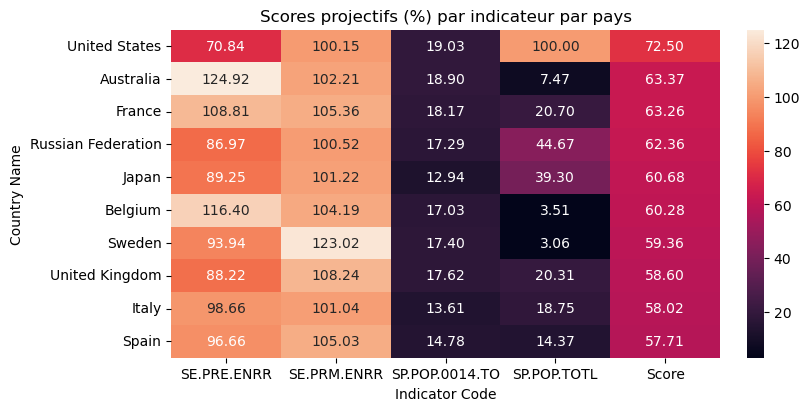

In [113]:
plt.figure(figsize=(8,4))
plt.title("Scores projectifs (%) par indicateur par pays")
sns.heatmap(last_predic.iloc[:10,:], annot=True, fmt=".2f")

### Projection sur une carte du monde

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
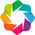

In [114]:
import geopandas as gpd
import geoviews as gv
import geoviews.feature as gf
from geoviews import dim
import xarray as xr
from cartopy import crs

gv.extension('bokeh', 'matplotlib')

In [115]:
world_map = gpd.read_file('countries.geojson')
world_map

,ADMIN,ISO_A3,ISO_A2,geometry
0,Aruba,ABW,AW,"MULTIPOLYGON (((-69.99694 12.57758, -69.93639 ..."
1,Afghanistan,AFG,AF,"MULTIPOLYGON (((71.04980 38.40866, 71.05714 38..."
2,Angola,AGO,AO,"MULTIPOLYGON (((11.73752 -16.69258, 11.73851 -..."
3,Anguilla,AIA,AI,"MULTIPOLYGON (((-63.03767 18.21296, -63.09952 ..."
4,Albania,ALB,AL,"MULTIPOLYGON (((19.74777 42.57890, 19.74601 42..."
...,...,...,...,...
250,Samoa,WSM,WS,"MULTIPOLYGON (((-171.57002 -13.93816, -171.564..."
251,Yemen,YEM,YE,"MULTIPOLYGON (((53.30824 12.11839, 53.31027 12..."
252,South Africa,ZAF,ZA,"MULTIPOLYGON (((37.86378 -46.94085, 37.83644 -..."
253,Zambia,ZMB,ZM,"MULTIPOLYGON (((31.11984 -8.61663, 31.14102 -8..."


In [116]:
world_map["ADMIN"].loc[world_map["ISO_A3"] =="USA"] = "United States"

C:\Users\octav\AppData\Local\Temp\ipykernel_9148\4198497113.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  world_map["ADMIN"].loc[world_map["ISO_A3"] =="USA"] = "United States"


In [117]:
geo_df = world_map.merge(last_predic.iloc[:10,:], how='left', left_on='ADMIN', right_on='Country Name')
geo_df

,ADMIN,ISO_A3,ISO_A2,geometry,SE.PRE.ENRR,SE.PRM.ENRR,SP.POP.0014.TO,SP.POP.TOTL,Score
0,Aruba,ABW,AW,"MULTIPOLYGON (((-69.99694 12.57758, -69.93639 ...",NaN,NaN,NaN,NaN,NaN
1,Afghanistan,AFG,AF,"MULTIPOLYGON (((71.04980 38.40866, 71.05714 38...",NaN,NaN,NaN,NaN,NaN
2,Angola,AGO,AO,"MULTIPOLYGON (((11.73752 -16.69258, 11.73851 -...",NaN,NaN,NaN,NaN,NaN
3,Anguilla,AIA,AI,"MULTIPOLYGON (((-63.03767 18.21296, -63.09952 ...",NaN,NaN,NaN,NaN,NaN
4,Albania,ALB,AL,"MULTIPOLYGON (((19.74777 42.57890, 19.74601 42...",NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
250,Samoa,WSM,WS,"MULTIPOLYGON (((-171.57002 -13.93816, -171.564...",NaN,NaN,NaN,NaN,NaN
251,Yemen,YEM,YE,"MULTIPOLYGON (((53.30824 12.11839, 53.31027 12...",NaN,NaN,NaN,NaN,NaN
252,South Africa,ZAF,ZA,"MULTIPOLYGON (((37.86378 -46.94085, 37.83644 -...",NaN,NaN,NaN,NaN,NaN
253,Zambia,ZMB,ZM,"MULTIPOLYGON (((31.11984 -8.61663, 31.14102 -8...",NaN,NaN,NaN,NaN,NaN


In [118]:
geo_df.dropna()

,ADMIN,ISO_A3,ISO_A2,geometry,SE.PRE.ENRR,SE.PRM.ENRR,SP.POP.0014.TO,SP.POP.TOTL,Score
15,Australia,AUS,AU,"MULTIPOLYGON (((158.86573 -54.74993, 158.83823...",124.919983,102.207817,18.898305,7.466761,63.373216
19,Belgium,BEL,BE,"MULTIPOLYGON (((4.81545 51.43107, 4.82268 51.4...",116.403008,104.192978,17.031238,3.511975,60.284800
71,Spain,ESP,ES,"MULTIPOLYGON (((-17.88512 27.79792, -17.92642 ...",96.659889,105.026321,14.777862,14.373260,57.709333
77,France,FRA,FR,"MULTIPOLYGON (((55.50131 -20.87322, 55.51401 -...",108.806732,105.358360,18.174278,20.702697,63.260517
81,United Kingdom,GBR,GB,"MULTIPOLYGON (((-6.28751 49.91401, -6.29727 49...",88.222710,108.240211,17.618800,20.313107,58.598707
112,Italy,ITA,IT,"MULTIPOLYGON (((12.62127 35.49234, 12.61109 35...",98.661018,101.037354,13.608181,18.754389,58.015235
116,Japan,JPN,JP,"MULTIPOLYGON (((141.46795 24.21377, 141.46315 ...",89.252678,101.224648,12.935748,39.301671,60.678686
215,Sweden,SWE,SE,"MULTIPOLYGON (((15.67530 56.12010, 15.68336 56...",93.936577,123.019188,17.399594,3.064772,59.355033
238,United States,USA,US,"MULTIPOLYGON (((-155.60652 20.13796, -155.5863...",70.839081,100.147041,19.028231,100.000000,72.503588


In [119]:
ax = geo_df.plot(column='Score', legend=True, cmap='PRGn')

ax.set_axis_off();

In [120]:
world = gv.Polygons(geo_df, vdims=['ADMIN','Score'])

world.opts(width=1000, height=500, cmap='Reds', color=dim('Score'), colorbar=True, tools=['hover'], aspect='equal')

:Polygons   [Longitude,Latitude]   (ADMIN,Score)

## Conclusion de la projection

En ce basant sur la population de niveau scolaire pré-primaire, primaire et la population entre 0 et 14 ans, la projection de potentiel de client est le plus élevé pour les Etats-unis, et ce de par leur population qui est bien plus importante que les autres pays.  
La Russie n'est pas une option réaliste, et la France ne compte pas, on a donc un top 5 :
- Etats-Unis
- Australie
- Japon
- Belgique
- Suède  
(- Royaume-Uni)


# Conclusion

Après avoir établi un classement sur le score moyen des 6 indicateurs choisis, il en résulte que les pays au plus fort potentiel pour une expansion seraient, dans l'ordre :
- Etats-Unis
- Belgique
- Australie
- Royaume-Uni
- Japon

**Belgique :**
On note un bémol pour la Belgique, qui comporte un taux de population particulièrement faible. Cela est rattrapé par la quantité d'élève du secondaire (par rapport à la population de 15-24 ans), à laquelle on peut ajouter une éventuelle facilité d'implémentation de par sa proximité géographique, et la langue française. Il faudrait s'intéresser aux informations détaillées du pays, notamment sur la proportion de francophones pour réévaluer le potentiel de ce pays.

Il est possible de tirer plusieurs conclusion de cette analyse :
- Les **Etats-Unis** ont un fort potentiel pour une expansion, et doivent être au coeur des questionnements
- La **Belgique** peut être une option intéressante à étudier également, car une installation dans ce pays pourrait être plus rapide. Une étude approfondie sur le sujet est nécessaire.
- L'**Australie** et le **Japon** sont des sujets qui demande de la réflexion. Etant donné leur scores et leur localisation, il serait peut etre judicieux de ne pas précipiter une éventuelle expansion dans ces pays.
- Le **Royaume-Uni** reste une option intéressante à moyen terme pour deux raison : La langue anglaise et la proximité géographique

Si un choix stratégique basé sur cette analyse était à faire, je proposerais ceci :
1. Acter sur la priorisation entre une expansion aux Etats-Unis (complexe) ou en Belgique (rapide), en fonction des facilités
2. Une fois les formations adaptée pour la langue anglaise, développer l'activité au Royaume-Uni à moyen terme
3. Réflechir sur le long terme à une expansion en Asie & Pacifique, en commencant probablement par l'Australie (anglais) puis le Japon

Il faut cependant souligner que **ces propositions sont purement spéculatives**, car de nombreuses limites sont à souligner sur cette analyse.

## Limite de cette analyse 
Plusieurs point sont à souligner au sujet des limites de cette analyse :
- Pour faire une analyse plus poussée, il serait intéressant de faire une **analyse concurrentielle** dans ces pays.  
- Par ailleurs, il faudrait compléter cette analyse en prenant en compte le **modèle économique** de notre entreprise (adaptation du modèle, prix des formations, coût et localisation des infrastructure réseau, ...)  
- Enfin, **des données plus récentes** seraient nécessaires pour conforter ce classement : 8 ans écoulés depuis l'année la plus récente de notre analyse, étant donné la vitesse d'évolution sur certains indicateurs, ce résultat est une représentation limitée de la situation de ces pays. 
- La question de la complexité de l'**adaptation en langue étrangère** des formations est un paramètre décisionnel essentiel

